## Motivation:

One of the things that make NYC so interesting to study is its diversity on many axes: ethnic, economic, cultural. Neighborohoods tend to be segregated and clustered on most socioeconomic characteristics, however these characteristics do evolve in time. The goal is to identify NYC neighborhoods that are homogeneous by clustering their socioeconomic characteristics in 2000, and in 2010, and find the neighborhoods that change cluster, indicating that they evolve differently with respect to their cluster peers (e.g. gentrification).

0) Load all necessary libraries

In [1]:
import numpy as np
import pandas as pd
import geopandas as gpd
from pandas import DataFrame
import os
import sys
import ast
import json
import urllib
import urllib2
from cStringIO import StringIO

In [2]:
import matplotlib.pylab as plt
import pylab as pl
#s = json.load( open(os.getenv('PUIDATA')+'/fbb_matplotlibrc.json') )
#pl.rcParams.update(s)
%matplotlib inline
%pylab inline

Populating the interactive namespace from numpy and matplotlib


/opt/rh/anaconda/root/envs/PUI2016_Python2/lib/python2.7/site-packages/IPython/core/magics/pylab.py:161: UserWarning: pylab import has clobbered these variables: ['plt']
`%matplotlib` prevents importing * from pylab and numpy
  "\n`%matplotlib` prevents importing * from pylab and numpy"


In [3]:
SQL_SOURCE = 'https://fb55.cartodb.com/api/v2/sql'

def queryCartoDB(query, format='CSV', source=SQL_SOURCE):
    """queries data from CartoDB SQL database
    Arguments:
    query: a string like 
            SELECT colum_name_1, column_name_2 FROM database_name
    format: the file format (e.g. CSV, GeoJson)
    source: the sql database url link
    Return:
        database as a string to be read in with the appropriate function
    """
    data = urllib.urlencode({'format': format, 'q': query})
    try:
        response = urllib2.urlopen(source, data)
    except urllib2.HTTPError, e:
        raise ValueError('\n'.join(ast.literal_eval(e.readline())['error']))
    except Exception:
        raise
    return StringIO(response.read())

In [4]:
import zipfile
from IPython.display import Image

In [5]:
#geography 
from fiona.crs import from_epsg
import shapely
from shapely.geometry import Point

In [6]:
#from PIL import Image
import sklearn.cluster
from sklearn.cluster import KMeans
from sklearn.cluster import AgglomerativeClustering

In [241]:
import scipy.stats

In [ ]:
import pysal as ps
import seaborn as sns
import re

In [ ]:
from matplotlib import cm
from descartes import PolygonPatch
import scipy.cluster as scp
from sklearn.cluster import AgglomerativeClustering
import scipy.cluster as scp

In [7]:
col= [
    '#FFB300', # Vivid Yellow
    '#803E75', # Strong Purple
    '#FF6800', # Vivid Orange
    '#A6BDD7', # Very Light Blue
    '#C10020', # Vivid Red
    '#CEA262', # Grayish Yellow
    '#817066', # Medium Gray
    ]

In [8]:
print (os.getenv("PUIDATA"))

/home/cusp/ss9558/PUIdata


1) Find the number of businesses in 2010 and 2000. This information is available at the zipcode level (HW11).

In [469]:
#download data
! wget ftp://ftp.census.gov/Econ2001_And_Earlier/CBP_CSV/zbp00\totals.zip;
! wget ftp://ftp.census.gov/econ2010\/CBP_CSV/zbp10\totals.zip; 
! mv zb*zip {os.getenv("PUIDATA")}

--2016-12-18 12:24:37--  ftp://ftp.census.gov/econ2010/CBP_CSV/zbp10totals.zip
           => “zbp10totals.zip”
Resolving ftp.census.gov... 148.129.75.35, 2610:20:2010:a09:1000:0:9481:4b23
Connecting to ftp.census.gov|148.129.75.35|:21... connected.
Logging in as anonymous ... Logged in!
==> SYST ... done.    ==> PWD ... done.
==> TYPE I ... done.  ==> CWD (1) /econ2010/CBP_CSV ... done.
==> SIZE zbp10totals.zip ... 797534
==> PASV ... done.    ==> RETR zbp10totals.zip ... done.
Length: 797534 (779K) (unauthoritative)

100%[======================================>] 797,534      436K/s   in 1.8s    

2016-12-18 12:24:39 (436 KB/s) - “zbp10totals.zip” saved [797534]

mv: setting attribute `security.selinux' for `security.selinux': Permission denied


In [11]:
#path = os.getenv("PUIDATA") + "/CensusBusinessData/"
path = os.getenv("PUIDATA") 
df_business = []
filename = 'zbp00totals.zip'
zf = zipfile.ZipFile(path + "/" + filename)
df_business = pd.read_csv(zf.open(filename.replace('.zip','.txt')),index_col = [0]
                          ,usecols = ['ZIP','EST'])
df_business.rename(columns = {'EST': '2000'}, inplace=True)

In [13]:
filename = 'zbp10totals.zip'
zf = zipfile.ZipFile(path + "/" + filename)
df_business_10 = pd.read_csv(zf.open(filename.replace('.zip','.txt')),index_col = [0],
                 usecols = ['zip','est'])
df_business_10.rename(columns = {'est': '2010'}, inplace=True)
df_business['2010'] = df_business_10['2010']
df_business.head()

,2000,2010
ZIP,,
501,1,2.0
1001,493,448.0
1002,563,570.0
1003,13,16.0
1004,48,21.0


2) Gather a zipcode shapefile and merge the number of businesses with the zipcode shapfile

In [108]:
!wget https://data.cityofnewyork.us/download/i8iw-xf4u/application%2Fzip
!unzip application%2Fzip
!mv ZIP* {os.getenv("PUIDATA")}

--2016-12-17 13:56:01--  https://data.cityofnewyork.us/download/i8iw-xf4u/application%2Fzip
Resolving data.cityofnewyork.us... 52.206.140.205
Connecting to data.cityofnewyork.us|52.206.140.205|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://data.cityofnewyork.us/api/file_data/YObIR0MbpUVA0EpQzZSq5x55FzKGM2ejSeahdvjqR20?filename=ZIP_CODE_040114.zip [following]
--2016-12-17 13:56:02--  https://data.cityofnewyork.us/api/file_data/YObIR0MbpUVA0EpQzZSq5x55FzKGM2ejSeahdvjqR20?filename=ZIP_CODE_040114.zip
Connecting to data.cityofnewyork.us|52.206.140.205|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 1514401 (1.4M) [application/octet-stream]
Saving to: “application%2Fzip.2”

100%[======================================>] 1,514,401   1.88M/s   in 0.8s    

2016-12-17 13:56:03 (1.88 MB/s) - “application%2Fzip.2” saved [1514401/1514401]

Archive:  application%2Fzip
  inflating: ZIP_CODE_040114.shx     
  inflating: ZIP_CODE_040114

In [17]:
nyczipsshp = gpd.read_file(os.getenv("PUIDATA") + "/ZIP_CODE_040114.shp")
nyczipsshp.columns
NYCZip = nyczipsshp[['geometry', 'ZIPCODE']]
NYCZip.rename(columns={'ZIPCODE':'ZIP'}, inplace=True)
NYCZip['ZIP'] = NYCZip['ZIP'].astype(str)
NYCZip.head()

/opt/rh/anaconda/root/envs/PUI2016_Python2/lib/python2.7/site-packages/ipykernel/__main__.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy


,geometry,ZIP
0,"POLYGON ((1038098.251871482 188138.3800067157,...",11436
1,"POLYGON ((1001613.712964058 186926.4395172149,...",11213
2,"POLYGON ((1011174.275535807 183696.33770971, 1...",11212
3,"POLYGON ((995908.3654508889 183617.6128015518,...",11225
4,"POLYGON ((991997.1134308875 176307.4958601296,...",11218


In [18]:
df_business['ZIP'] = df_business.index.astype(str)
df_business.shape

(39853, 3)

In [19]:
#merge two datasets
df_merge = pd.merge(df_business, NYCZip, how='inner', on=['ZIP'])
df_merge.head()

,2000,2010,ZIP,geometry
0,7317,7241.0,10001,"POLYGON ((981958.6472873986 213464.4530421346,..."
1,2277,2872.0,10002,"POLYGON ((991339.8703228086 207576.7837151289,..."
2,3683,4113.0,10003,"POLYGON ((989830.469142139 207048.1263078749, ..."
3,1294,1398.0,10004,"POLYGON ((981197.408652395 196571.0816452205, ..."
4,1294,1398.0,10004,"POLYGON ((972696.8446168154 193014.5477478057,..."


In [ ]:
#whitening the data???

3) Find the density of businesses by dividing the number of businesses by the area of the zipcode (see the hints file if you need to) and show them the density in a choroplath (a heatmap version of a geographical map where each zipcode (census tract later) is a different color based on the value of the feature you are mapping) for 2000 and 2010 

In [20]:
NYC_Area = NYCZip.to_crs(epsg=2263).geometry.area/(2.788*10**7) # from ft2 to mi2 
#NYC_Area
NYCZip['Area'] = NYC_Area
NYCZip.head()

/opt/rh/anaconda/root/envs/PUI2016_Python2/lib/python2.7/site-packages/ipykernel/__main__.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  app.launch_new_instance()


,geometry,ZIP,Area
0,"POLYGON ((1038098.251871482 188138.3800067157,...",11436,0.814178
1,"POLYGON ((1001613.712964058 186926.4395172149,...",11213,1.062805
2,"POLYGON ((1011174.275535807 183696.33770971, 1...",11212,1.505456
3,"POLYGON ((995908.3654508889 183617.6128015518,...",11225,0.850023
4,"POLYGON ((991997.1134308875 176307.4958601296,...",11218,1.322410


In [21]:
#merge the dataset 
df_merge = pd.merge(df_business, NYCZip, how='inner', on=['ZIP'])
df_merge.head()

,2000,2010,ZIP,geometry,Area
0,7317,7241.0,10001,"POLYGON ((981958.6472873986 213464.4530421346,...",0.638269
1,2277,2872.0,10002,"POLYGON ((991339.8703228086 207576.7837151289,...",0.942616
2,3683,4113.0,10003,"POLYGON ((989830.469142139 207048.1263078749, ...",0.557331
3,1294,1398.0,10004,"POLYGON ((981197.408652395 196571.0816452205, ...",0.143562
4,1294,1398.0,10004,"POLYGON ((972696.8446168154 193014.5477478057,...",0.043139


In [22]:
df_merge['2000_density'] = df_merge['2000']/df_merge['Area']
df_merge['2010_density'] = df_merge['2010']/df_merge['Area']

In [211]:
#df_merge['log_2000_density'] = np.log(df_merge['2000_density'])
#df_merge['log_2010_density'] = np.log(df_merge['2010_density'])

In [218]:
df_merge = gpd.GeoDataFrame(df_merge)

In [240]:
df_merge.head()

,2000,2010,ZIP,geometry,Area,2000_density,2010_density,dif
0,7317,7241.0,10001,"POLYGON ((981958.6472873986 213464.4530421346,...",0.638269,11463.818261,11344.746211,119.072050
1,2277,2872.0,10002,"POLYGON ((991339.8703228086 207576.7837151289,...",0.942616,2415.618317,3046.840495,-631.222178
2,3683,4113.0,10003,"POLYGON ((989830.469142139 207048.1263078749, ...",0.557331,6608.286428,7379.821363,-771.534935
3,1294,1398.0,10004,"POLYGON ((981197.408652395 196571.0816452205, ...",0.143562,9013.498952,9737.922361,-724.423409
4,1294,1398.0,10004,"POLYGON ((972696.8446168154 193014.5477478057,...",0.043139,29996.248352,32407.075112,-2410.826761


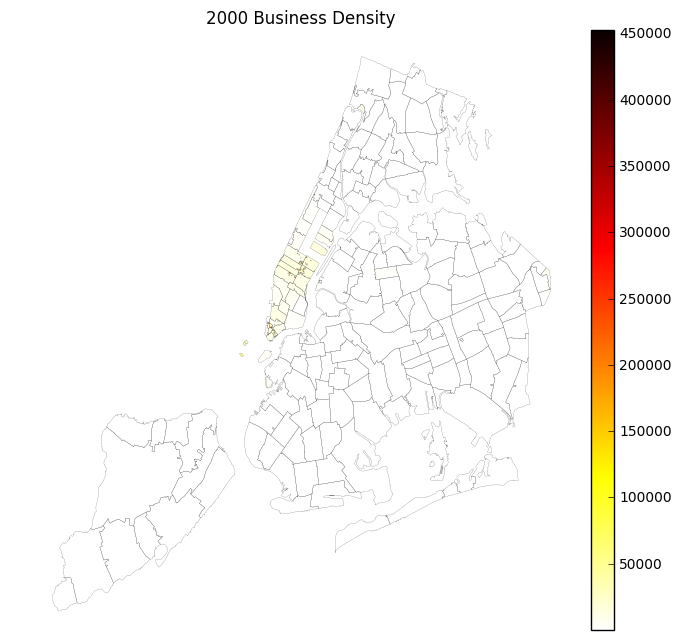

In [505]:
f, ax = plt.subplots(figsize=(7.5,7.5))
ax.get_xaxis().set_visible(False)
ax.get_yaxis().set_visible(False)
df_merge.plot(column='2000_density',colormap='hot_r',alpha=1,linewidth=0.1,ax=ax)
plt.title("2000 Business Density")
vmin, vmax = min(df_merge['2000_density'].values), \
            max(df_merge['2000_density'].values)
ax.axis('off')
fig = ax.get_figure()
cax = fig.add_axes([0.9, 0.1, 0.03, 0.8])
sm = plt.cm.ScalarMappable(cmap='hot_r', norm=plt.Normalize(vmin=vmin, vmax=vmax))
sm._A = []
fig.colorbar(sm, cax=cax)

##  Figure 1: NYC business density in 2000 
## In year 2000, the most high-density area are midtown and financial district in Manhattan. Upper east, west and small islands such as Liberty island also show a relative high business density. 

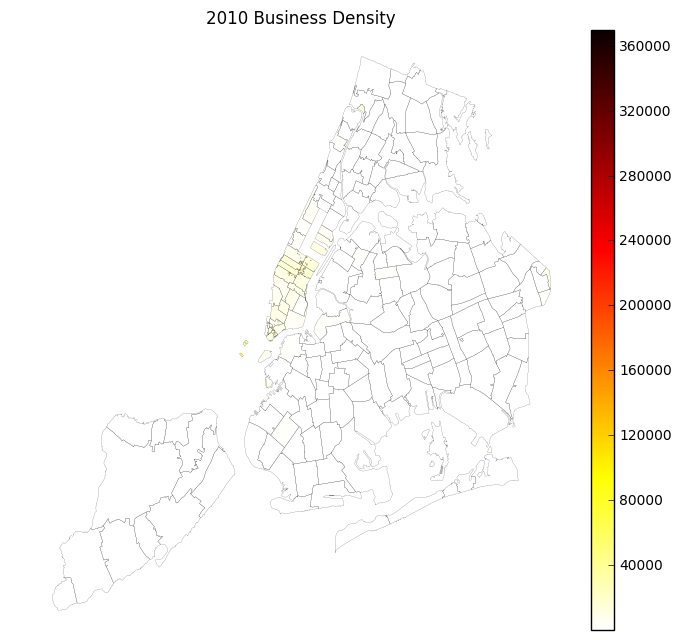

In [506]:
f, ax = plt.subplots(figsize=(7.5,7.5))
ax.get_xaxis().set_visible(False)
ax.get_yaxis().set_visible(False)
df_merge.plot(column='2010_density',colormap='hot_r',alpha=1,linewidth=0.1,ax=ax)
plt.title("2010 Business Density")
vmin, vmax = min(df_merge['2010_density'].values), \
            max(df_merge['2010_density'].values)
ax.axis('off')
fig = ax.get_figure()
cax = fig.add_axes([0.9, 0.1, 0.03, 0.8])
sm = plt.cm.ScalarMappable(cmap='hot_r', norm=plt.Normalize(vmin=vmin, vmax=vmax))
sm._A = []
fig.colorbar(sm, cax=cax)

##  Figure 2: density of business in 2010, NYC
## In year 2010, condition does not change a lot compared to 2000. Besides business in Manhattan, there are some business increasing in Brooklyn and Queens as well. 

(OPTIONALLY: also show the difference in business density between 2000 and 2010 in a map, this will help you make sure you are on the right track)

In [516]:
df_merge['dif'] =  df_merge['2010_density'] - df_merge['2000_density']

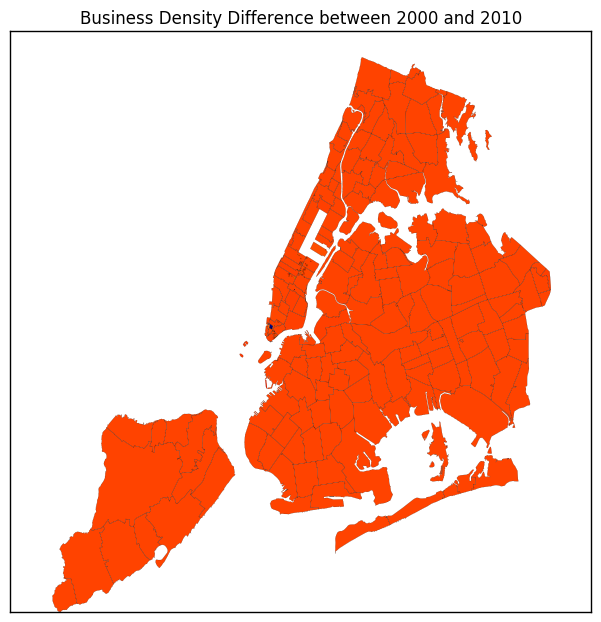

In [600]:
f, ax = plt.subplots(figsize=(7.5,7.5))
ax.get_xaxis().set_visible(False)
ax.get_yaxis().set_visible(False)
df_merge.plot(column='dif',alpha=1,linewidth=0.1,ax=ax)
plt.title("Business Density Difference between 2000 and 2010")
#vmin, vmax = min(df_merge['dif'].values), \
            #max(df_merge['dif'].values)
#ax.axis('off')
#fig = ax.get_figure()
#cax = fig.add_axes([0.9, 0.1, 0.03, 0.8])
#sm = plt.cm.ScalarMappable(cmap='hot_r', norm=plt.Normalize(vmin=vmin, vmax=vmax))
#sm._A = []
#fig.colorbar(sm, cax=cax)

## Figure 3: Business density difference between year 2000 and 2010, NYC
## The overall density does not  change a lot, but the business density decreases in lower Manhattan (the black spot).

4) Collect census data from the 2010 and 2000 census and extract the estimate (mean) age, population, and diversity of each census tract for all 5 NYC boroughs. The diversity (or lack thereof) can be measured by the fraction of white population.

In [ ]:
#FROM  DEC_00_SF1_DP1,DEC_10_SF1_SF1DP1,acs_10_5yr_s1901_with_ann,
#dec_00_sf3_dp3_with_ann

In [30]:
# collect 2000 census data 
Query = '''
SELECT GEO_id as "geo_id",hc01_vc01 as "2000population",
hc02_vc29 as "2000diversity",hc01_vc18 as "2000age"
FROM  DEC_00_SF1_DP1
'''
datastream = queryCartoDB(Query, format='CSV')
#data       = pd.read_csv(database_name)
#facilityData   = json.loads(facilityStream.read())
df_2000demo = pd.read_csv(datastream)

In [31]:
df_2000demo.head() 

,geo_id,2000population,2000diversity,2000age
0,1400000US36047054300,0,NaN,0.0
1,1400000US36081121100,0,NaN,0.0
2,1400000US36005003700,478,18.4,22.0
3,1400000US36005004900,246,20.7,30.0
4,1400000US36005005800,5,0.0,23.5


In [250]:
# collect 2010 census data 
Query = '''
SELECT geo_id as "geo_id",hd01_s001 as "2010population",hd02_s078 as "2010diversity",
hd01_s020 as "2010age"
FROM  DEC_10_SF1_SF1DP1
'''
datastream = queryCartoDB(Query, format='CSV')
#data       = pd.read_csv(database_name)
#facilityData   = json.loads(facilityStream.read())
df_2010demo = pd.read_csv(datastream)

In [251]:
df_2010demo.head()

,geo_id,2010population,2010diversity,2010age
0,1400000US36081038301,0,NaN,0.0
1,1400000US36005002400,4,50.0,38.0
2,1400000US36059990200,0,NaN,0.0
3,1400000US36059990400,0,NaN,0.0
4,1400000US36007012900,1532,98.2,59.8


5) Collect the income data by census tract from the income from American Fact Finder for the years 2010 and 2000 at the census tract level.

In [35]:
#collect 2000 income data by census tract
Query = '''
SELECT geo_id,hc01_vc64 as "2000income"
FROM  dec_00_sf3_dp3_with_ann
'''
datastream = queryCartoDB(Query, format='CSV')
#data       = pd.read_csv(database_name)
#facilityData   = json.loads(facilityStream.read())
df_2000income = pd.read_csv(datastream)

In [36]:
df_2000income.head()

,geo_id,2000income
0,1400000US36089991900,0
1,1400000US36001013703,68929
2,1400000US36005000200,42539
3,1400000US36005002400,0
4,1400000US36029001301,0


In [300]:
#collect 2010 income data by census tract
Query = '''
SELECT  geo_id,hc03_est_vc13 as "2010income"
FROM  acs_10_5yr_s1901_with_ann
'''
datastream = queryCartoDB(Query, format='CSV')
#data       = pd.read_csv(database_name)
#facilityData   = json.loads(facilityStream.read())
df_2010income = pd.read_csv(datastream)
#,hc01_vc85

In [301]:
df_2010income.head()

,geo_id,2010income
0,1400000US36001000100,28750.0
1,1400000US36001000200,44612.0
2,1400000US36001000300,66953.0
3,1400000US36001000401,110590.0
4,1400000US36001000403,92763.0


6) Merge the datasets for each year and show a the tables containing the relevant data: the features and whatever else you need to identify and plot the data.

In [334]:
#merge the data
df_2000 = pd.merge(df_2000demo,df_2000income, how='inner', on=['geo_id'])
df_2000.head()

,geo_id,2000population,2000diversity,2000age,2000income
0,1400000US36047054300,0,NaN,0.0,0
1,1400000US36081121100,0,NaN,0.0,0
2,1400000US36005003700,478,18.4,22.0,23750
3,1400000US36005004900,246,20.7,30.0,25662
4,1400000US36005005800,5,0.0,23.5,6250


In [336]:
#merge the data
df_2010 = pd.merge(df_2010demo,df_2010income, how='inner', on=['geo_id'])
#df_2010 = df_2010.replace('-',np.NaN)
#df_2010 = df_2010.replace('250000+','250000')
#df_2010['2010income'] = df_2010['2010income'].str.replace(",", "")
#df_2010['2010income'] = df_2010['2010income'].str.replace("+", "")
#df_2010['2010income'] = df_2010['2010income'].str.replace("-", "")
#df_2010['2010income'] = df_2010['2010income'].astype(float)
df_2010.head()

,geo_id,2010population,2010diversity,2010age,2010income
0,1400000US36081038301,0,NaN,0.0,0.0
1,1400000US36005002400,4,50.0,38.0,0.0
2,1400000US36059990200,0,NaN,0.0,0.0
3,1400000US36059990400,0,NaN,0.0,0.0
4,1400000US36007012900,1532,98.2,59.8,73056.0


In [337]:
df_total = pd.merge(df_2000,df_2010, how='inner', on=['geo_id'])
df_total.head()

,geo_id,2000population,2000diversity,2000age,2000income,2010population,2010diversity,2010age,2010income
0,1400000US36047054300,0,NaN,0.0,0,327,70.9,33.8,0.0
1,1400000US36081121100,0,NaN,0.0,0,0,NaN,0.0,0.0
2,1400000US36005003700,478,18.4,22.0,23750,245,24.5,35.1,23348.0
3,1400000US36005017100,3,0.0,47.5,0,0,NaN,0.0,0.0
4,1400000US36009940200,2,100.0,31.0,11250,0,NaN,0.0,0.0


In [338]:
#difference
df_total['dif_population'] = df_total['2010population'].astype(float) - df_total['2000population'].astype(float)
df_total['dif_diversity'] = df_total['2010diversity'].astype(float) - df_total['2000diversity'].astype(float)
df_total['dif_age'] = df_total['2010age'].astype(float) - df_total['2000age'].astype(float)
df_total['dif_income'] = df_total['2010income'].astype(float) - df_total['2000income'].astype(float)

In [339]:
df_total.head()

,geo_id,2000population,2000diversity,2000age,2000income,2010population,2010diversity,2010age,2010income,dif_population,dif_diversity,dif_age,dif_income
0,1400000US36047054300,0,NaN,0.0,0,327,70.9,33.8,0.0,327.0,NaN,33.8,0.0
1,1400000US36081121100,0,NaN,0.0,0,0,NaN,0.0,0.0,0.0,NaN,0.0,0.0
2,1400000US36005003700,478,18.4,22.0,23750,245,24.5,35.1,23348.0,-233.0,6.1,13.1,-402.0
3,1400000US36005017100,3,0.0,47.5,0,0,NaN,0.0,0.0,-3.0,NaN,-47.5,0.0
4,1400000US36009940200,2,100.0,31.0,11250,0,NaN,0.0,0.0,-2.0,NaN,-31.0,-11250.0


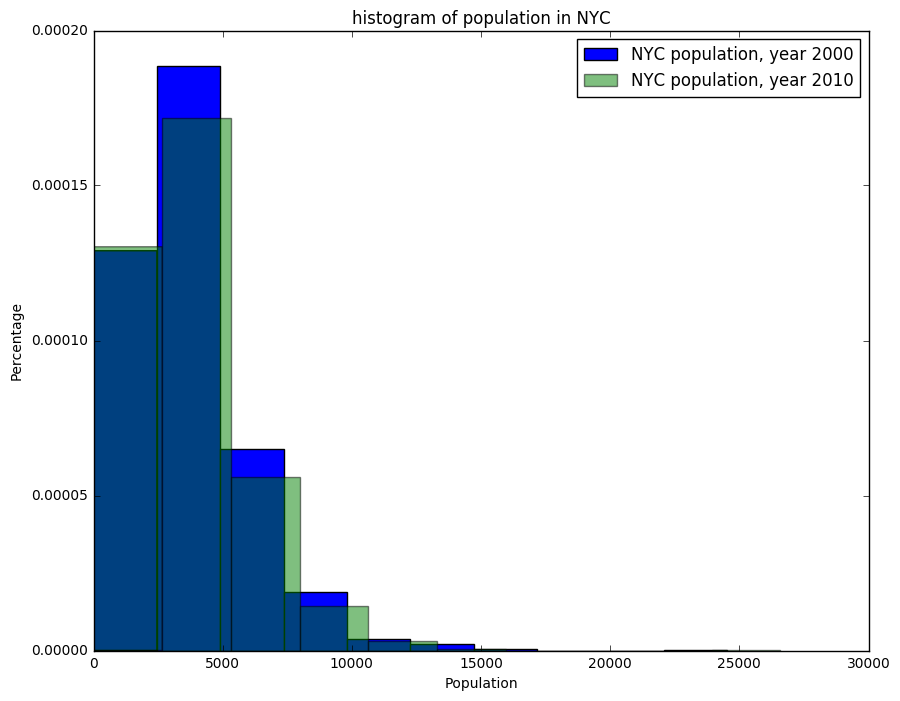

In [276]:
#plot histogram
pl.figure(figsize = (10, 8))
h1 = pl.hist(df_total['2000population'], label = "NYC population, year 2000", normed=True)
h2 = pl.hist(df_total['2010population'], label = "NYC population, year 2010", 
             normed=True, alpha = 0.5)
title = pl.title("histogram of population in NYC")
leg = pl.legend()
pl.xlabel('Population')
pl.ylabel("Percentage")

## Figure 4: Population histogram in year 2000 and 2010, NYC (zipcode level)
## The distribution does not change much during 10 years. 

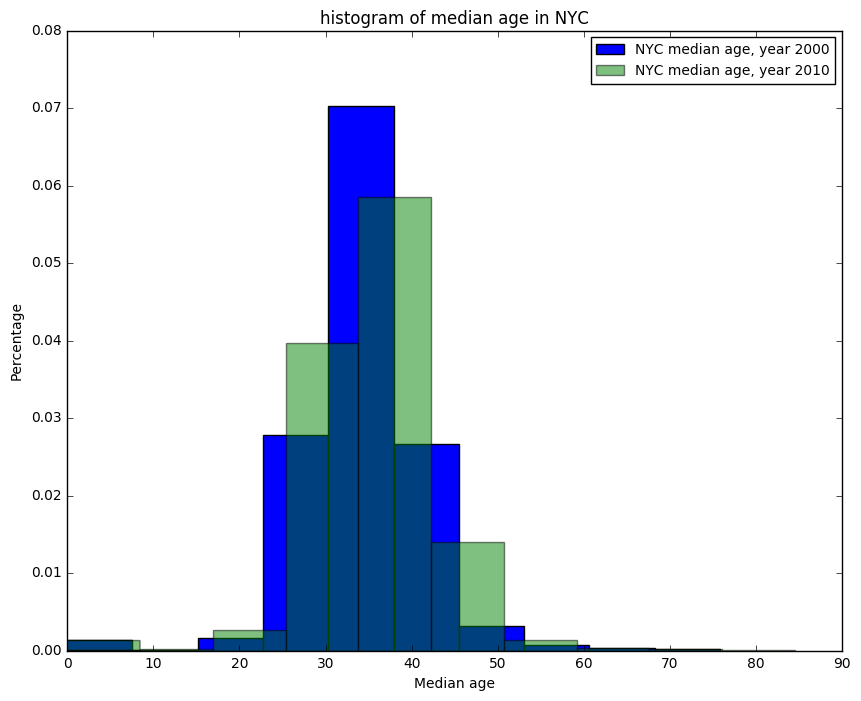

In [274]:
#plot histogram
pl.figure(figsize = (10, 8))
h1 = pl.hist(df_total['2000age'], label = "NYC median age, year 2000", normed=True)
h2 = pl.hist(df_total['2010age'], label = "NYC median age, year 2010", normed=True, alpha = 0.5)
title = pl.title("histogram of median age in NYC")
leg = pl.legend(fontsize = 10)
pl.xlabel('Median age')
pl.ylabel("Percentage")

## Figure 5: Median age distribution in year 2000 and 2010, NYC (zipcode level)

## Compared to 2000, median age distribution becomes scatter and average median age gets larger. Most of communities have a median age around 30~40.

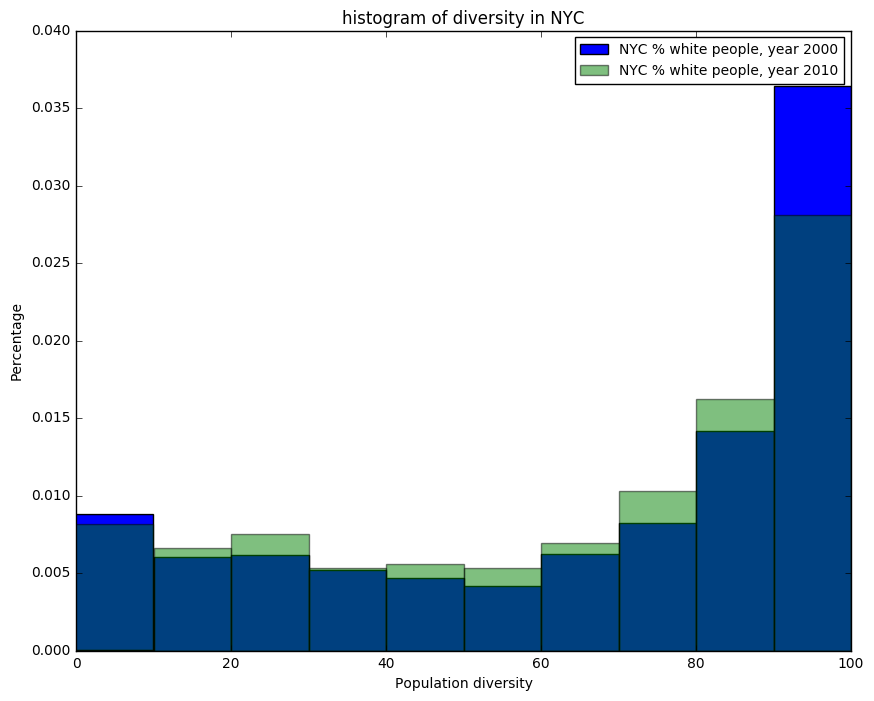

In [525]:
#plot histogram
pl.figure(figsize = (10, 8))
h1 = pl.hist(df_total['2000diversity'].dropna(), label = "NYC % white people, year 2000", normed=True)
h2 = pl.hist(df_total['2010diversity'].dropna(), label = "NYC % white people, year 2010",
             normed=True, alpha = 0.5)
title = pl.title("histogram of diversity in NYC")
leg = pl.legend(fontsize = 10)
pl.xlabel('Population diversity')
pl.ylabel("Percentage")

## Figure 6: Diversity distribution in year 2000 and 2010, NYC (% of white in zipcode level)

## Compared to 2000,  communities in New York City has a higher diversity since percentage of white population declines in a lot of area.  However, most of neighbourhoods still have a majority of white people. 

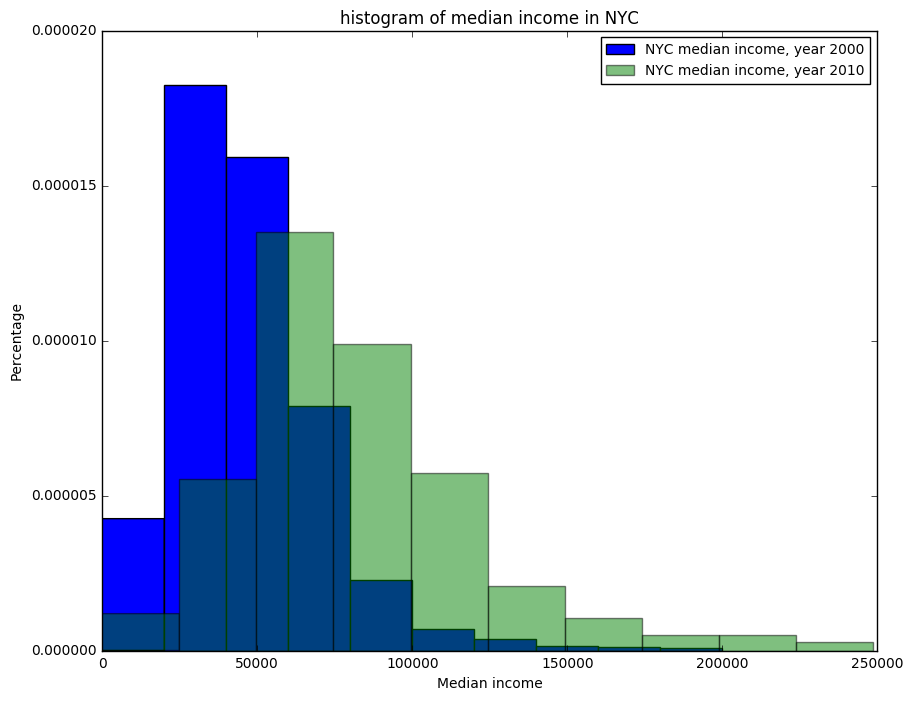

In [523]:
#plot histogram
pl.figure(figsize = (10, 8))
h1 = pl.hist(df_total['2000income'].dropna(), label = "NYC median income, year 2000", normed=True)
h2 = pl.hist(df_total['2010income'].dropna(), label = "NYC median income, year 2010",
             normed=True, alpha = 0.5)
title = pl.title("histogram of median income in NYC")
leg = pl.legend(fontsize = 10)
pl.xlabel('Median income')
pl.ylabel("Percentage")

## Figure 7: Median income distribution in year 2000 and 2010, NYC 

## Compared to 2000,  median income has increased a lot, but the distribution looks more skewed.

7) Merge the df with the census tracts shapefile (see DATA and HINTS files) and display each of your features as a choropleth for both 2010 and 2000, and show the difference in the features as a third choroplath.

In [45]:
countyID = {'Bronx':'005',
           'Manhattan':'061',
           'Staten Island':'085',
           'Brooklyn':'047',
           'Queens':'081'}

In [46]:
Query = '''
SELECT  *
FROM  table_2010_census_tracts
'''

In [47]:
# census tract shape file
datastream = queryCartoDB(Query, format='GeoJSON')
datageo  = json.loads(datastream.read())
ct_shape = gpd.GeoDataFrame.from_dict(datageo['features'])
ct = gpd.GeoDataFrame.from_features(datageo['features'])

In [48]:
ct['allcodes'] = list(zip(ct.boro_name, ct.ct_2010))

In [49]:
ct['geo_id']  = ct[['allcodes']].applymap(lambda x: 
                            ("1400000US36%03d%06d"%(int(countyID[x[0]]),int(x[1]))))

In [50]:
#df_2000 = pd.merge(df_2000,ct, how='inner', on=['geo_id'])
#df_2010 = pd.merge(df_2010,ct, how='inner', on=['geo_id'])
#df_2000 = gpd.GeoDataFrame(df_2000)
#df_2010 = gpd.GeoDataFrame(df_2010)

In [342]:
df_ct_total = pd.merge(df_total,ct, how='inner', on=['geo_id'])
df_ct_total = gpd.GeoDataFrame(df_ct_total)

In [343]:
df_ct_dropna = pd.DataFrame.dropna(df_ct_total)
df_ct_dropna = gpd.GeoDataFrame(df_ct_dropna)

In [603]:
#choropleth plot function
def choropleth(gdf, columnname,title,cmap = 'RdGy', ax=None):
    """ display each of a GeoDataFrame's features as a choropleth map
    Arguments:
    gdf: a GeoDataFrame 
    columnname : the column that you would like to plot from the data frame
    year: year
    variable_name : the variable you plot
    colormap: RdGy type
    ax: None
    Return:
        a choropleth    
    """
    f, ax = plt.subplots(figsize=(7.5,7.5))
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)
    #plt.title("Choropleth plot for NYC %s in year %d"%(variable_name,year))
    plt.title(title)
    ax = gdf.plot(column= columnname, colormap='RdGy',alpha = 1, axes=ax)
    vmin, vmax = min(gdf[columnname].values), \
            max(gdf[columnname].values)
    ax.axis('off')
    fig = ax.get_figure()
    cax = fig.add_axes([0.9, 0.1, 0.03, 0.8])
    sm = plt.cm.ScalarMappable(cmap='RdGy', norm=plt.Normalize(vmin=vmin, vmax=vmax))
    sm._A = []
    fig.colorbar(sm, cax=cax)

In [83]:
choropleth_2000 = ['2000population','2000diversity','2000age','2000income']
choropleth_2010 = ['2010population','2010diversity','2010age','2010income']
difference = ['dif_population','dif_diversity','dif_diversity','dif_income']
variables = ['population', 'diversity','median age','median income']

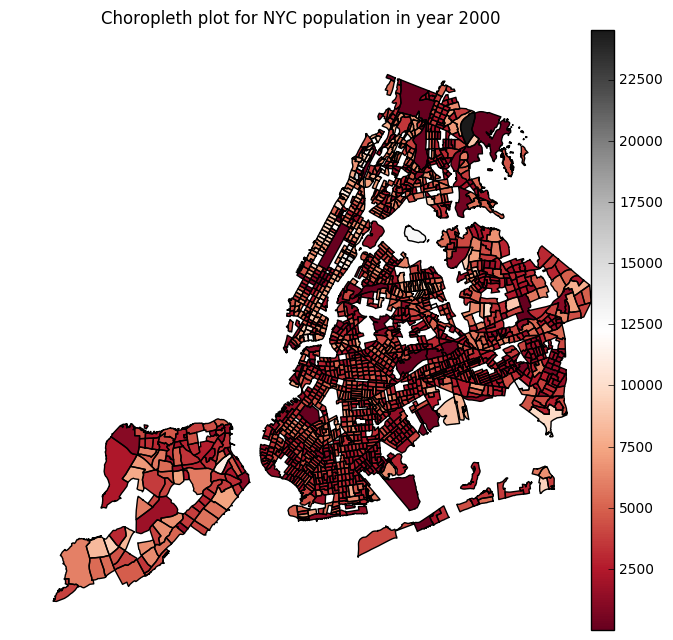

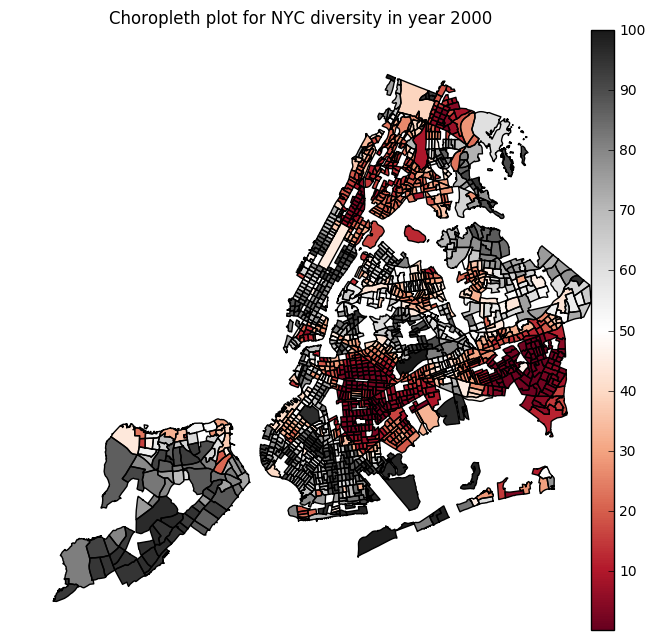

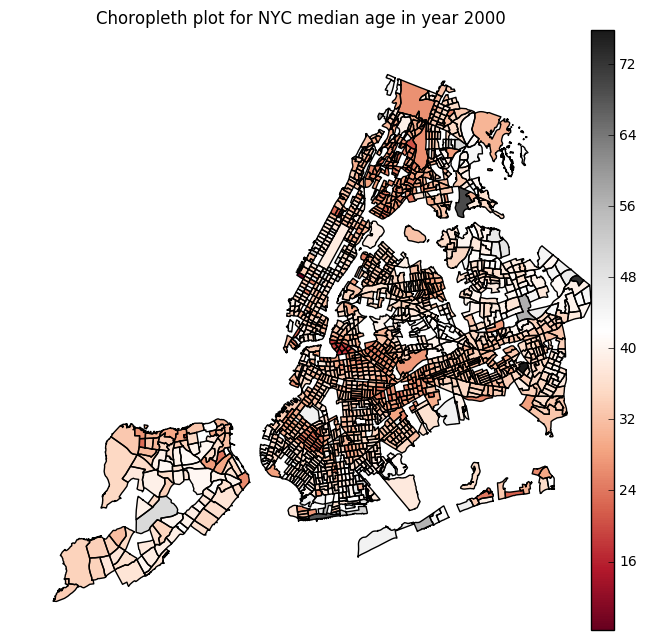

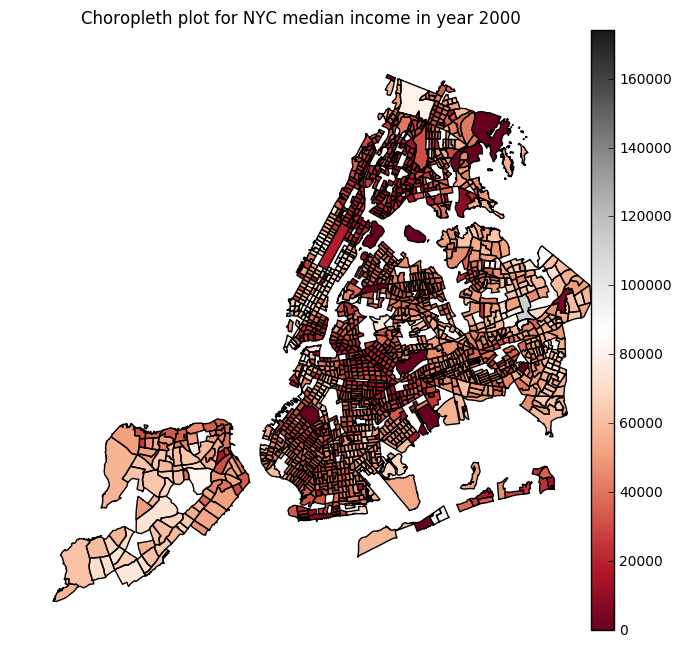

In [604]:
for i in range(len(choropleth_2000)):
    choropleth(df_ct_dropna,choropleth_2000[i],\
               "Choropleth plot for NYC %s in year 2000"%(variables[i])\
               ,cmap = 'RdGy', ax=None)
    #plt.title("Choropleth plot for NYC %s in year 2000"%(variables[i]))

## Figure 8: Choropleth plot in year 2000, NYC 

## Midtown, upper east and west show a relative high population density while a neighborhood in upper Bronx has a highest density overall. Diversity in upper east,west, midtown and downtown Mathattan is relatively low compared to Bronx, Brooklyn and some places in Queens. There are more young people living in Brooklyn and Bronx. Considering median income, people live in upper east have the highest income over the whole city. 

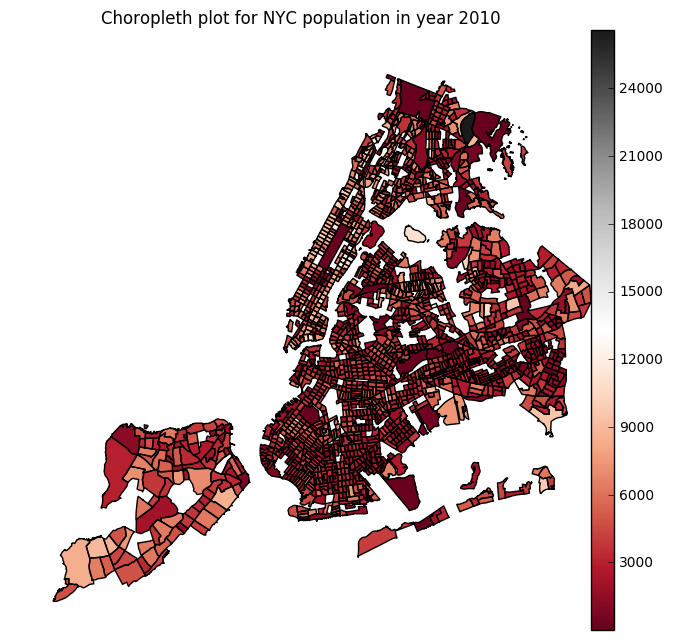

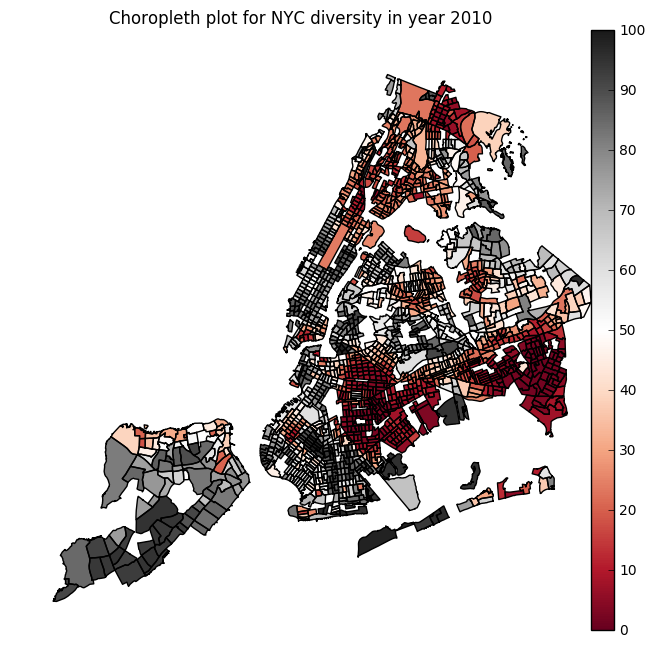

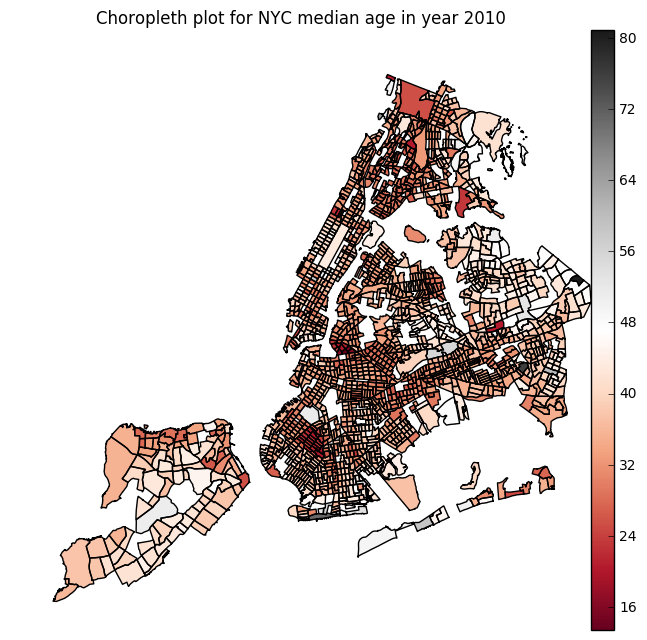

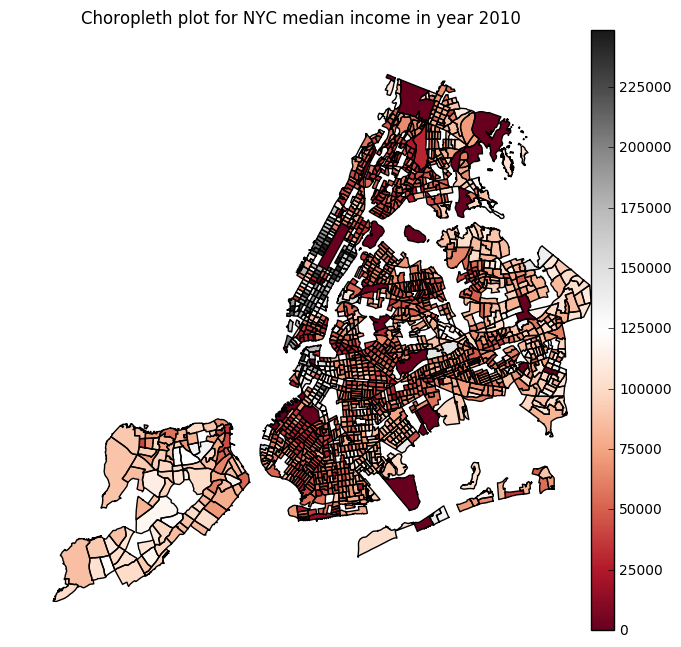

In [605]:
for i in range(len(choropleth_2010)):
    choropleth(df_ct_dropna,choropleth_2010[i],
               "Choropleth plot for NYC %s in year 2010"%(variables[i]) \
               ,cmap = 'RdGy', ax=None)

## Figure 9: Choropleth plot in year 2010, NYC 

## Compared to year 2000, the population distribution does not change much overall; there are more neighbourhood that have a higher diversity compared to 10 years ago.  Young people are having the trend moving to Manhattan, especially in downtown area.  There are more high income communities: midtown, downtown, upper west, and downtown Brooklyn. 

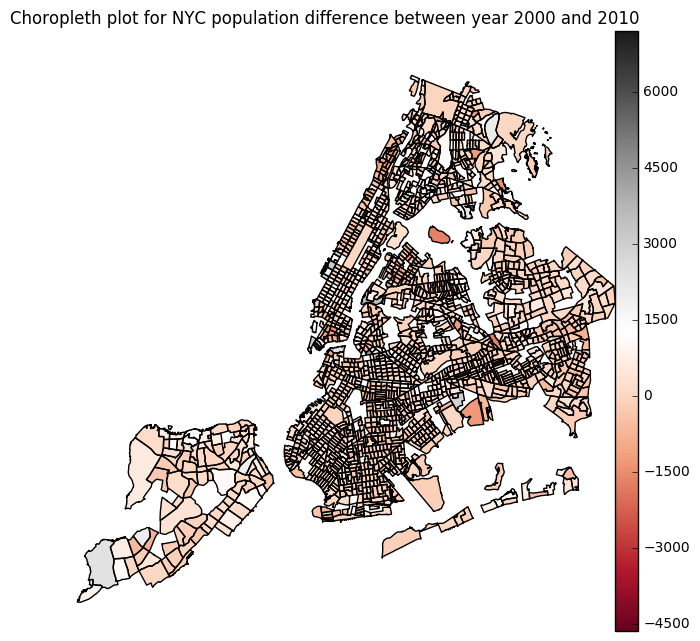

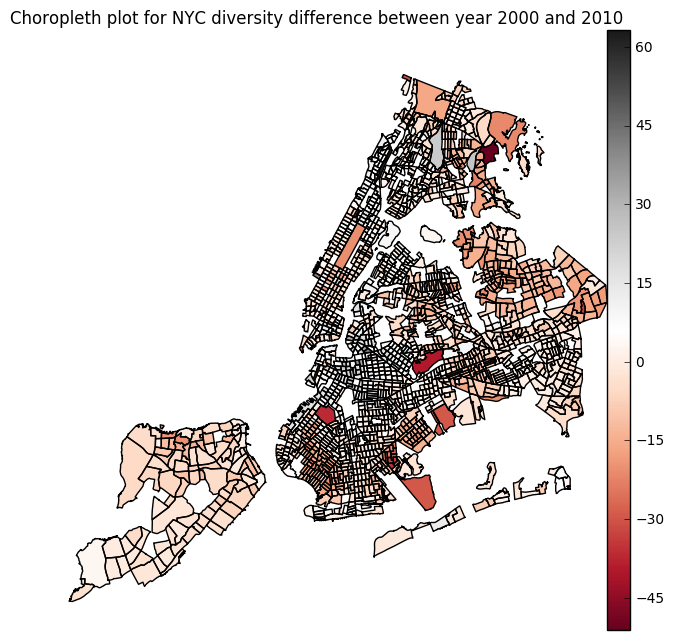

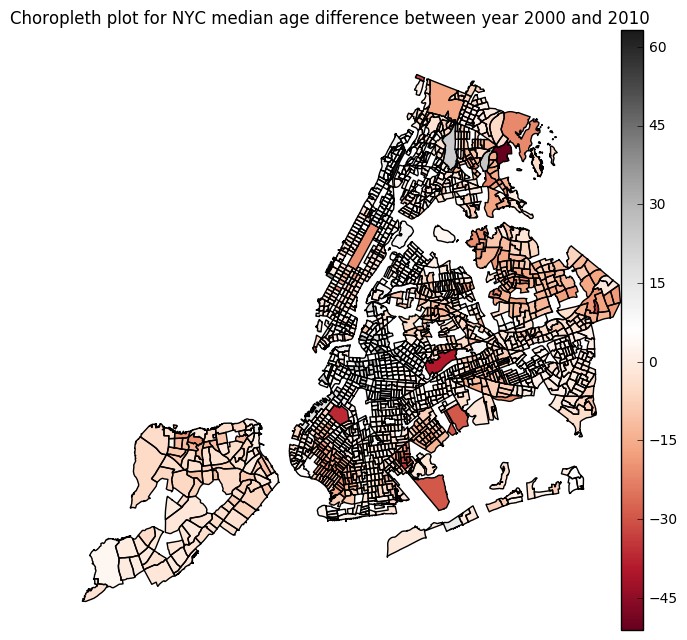

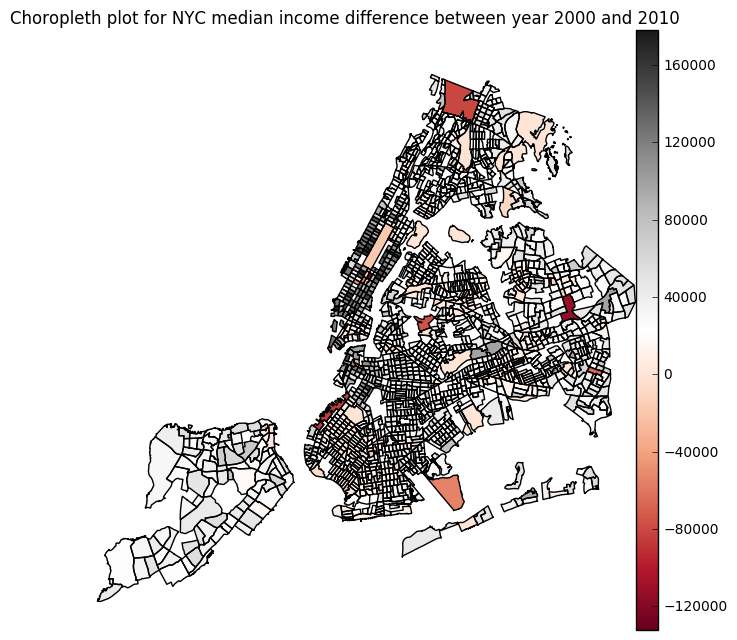

In [345]:
#plot difference
for i in range(len(difference)):
    choropleth(df_ct_dropna,difference[i],\
               "Choropleth plot for NYC %s difference between year 2000 and 2010"%(variables[i])\
               ,cmap = 'RdGy', ax=None)

## Figure 10: Choropleth plot showing difference between year 2000 and 2010, NYC 

## Over these 10 years,  the population distribution does not change much overall but there are a lot of moving among neighbourhoods; there are more neighbourhood that have a higher diversity compared to 10 years ago,especially in Bronx, Queens, Staten island.  Young people are having the trend moving to Queens, upper Bronx, and Manhattan, especially in downtown area.  There are more high income communities showing up: midtown, downtown, upper west, and downtown Brooklyn. 

STEP 8 AND 9 ARE OPTIONAL BUT IF YOU DO THEM IT SHOULD ENABLE YOU TO MAKE MORE INSIGHTFUL COMMENTS ABOUT THE METHOD

8) (OPTIONAL) Cluster the census tracts on these four features (using a Eucledian distance)


In [85]:
#df_totaldropna = pd.DataFrame.dropna(df_ct_total)
#print(len(df_ct_total))
print(len(df_ct_dropna))

1880


In [351]:
#clustering
nc = 5
km00 = KMeans(n_clusters=nc, random_state=444)
km00.fit(df_ct_dropna[['2000population','2000diversity','2000income','2000age']])
labels00 = km00.labels_
centers00 = km00.cluster_centers_

In [352]:
df_ct_dropna['label00'] = labels00

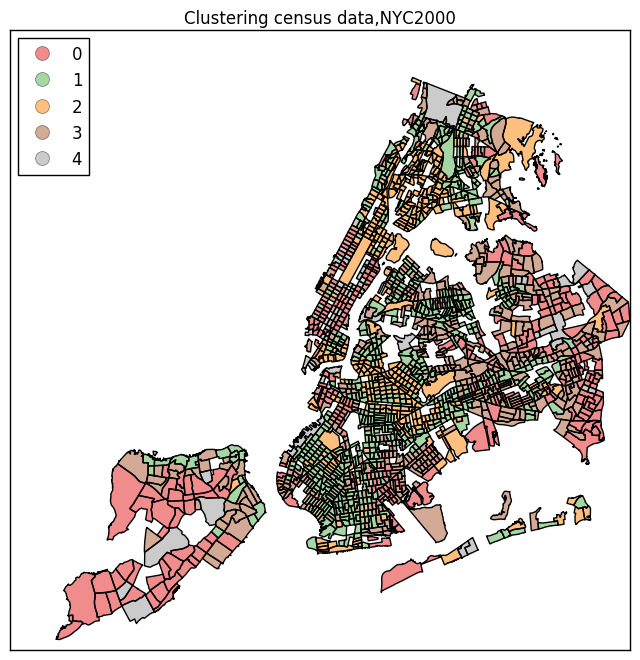

In [613]:
f, ax = plt.subplots(figsize=(8,8))
ax.get_xaxis().set_visible(False)
ax.get_yaxis().set_visible(False)
df_ct_dropna.plot(column= 'label00',categorical=True,legend=True,ax=ax)
plt.title("Clustering census data,NYC2000")

## Figure 11 : Clustering NYC 2000 census data by 5 clusters using k means

In [354]:
km10 = KMeans(n_clusters=nc, init = centers00)
km10.fit(df_ct_dropna[['2010population','2010diversity','2010income','2010age']])
labels10 = km10.labels_
centers10 = km10.cluster_centers_

In [355]:
df_ct_dropna['label10'] = labels10

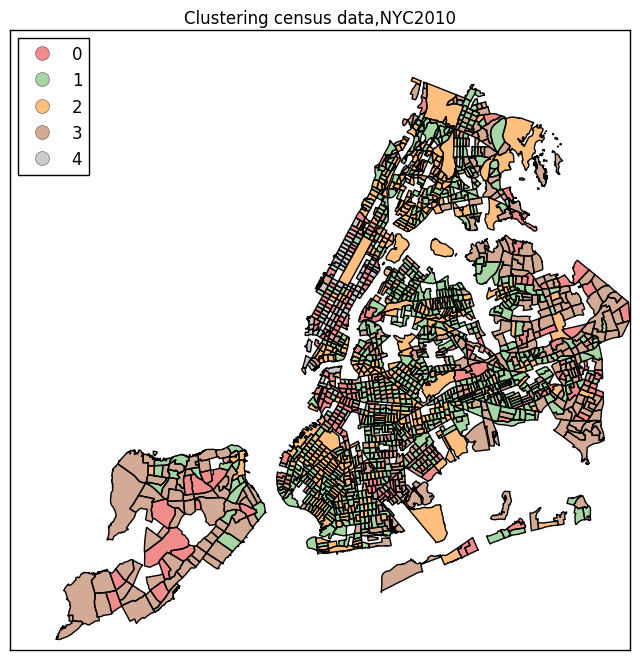

In [614]:
f, ax = plt.subplots(figsize=(8,8))
ax.get_xaxis().set_visible(False)
ax.get_yaxis().set_visible(False)
df_ct_dropna.plot(column= 'label10',categorical=True,legend=True,ax=ax)
plt.title("Clustering census data,NYC2010")

## Figure 12 : Clustering NYC 2010 census data by 5 clusters using k means

9) (OPTIONAL) Identify the census tracts that have changed cluster assignment (those that are now associated with a different group of census tracts) and show a choropleth of the clusters in 2010, 2000 and a choropleth of the cluster changes. (Once you get through this, you have done most of the heavy lifting! The rest isbuilding upon this work.)

In [360]:
df_ct_dropna['dif_label'] = 10 * (df_ct_dropna['label00'] +1) + (df_ct_dropna['label10'] + 1)
unique(df_ct_dropna['dif_label'])

array([11, 12, 13, 14, 15, 21, 22, 23, 24, 25, 31, 32, 33, 34, 41, 42, 43,
       44, 45, 51, 53, 54, 55], dtype=int32)

In [361]:
cluster_same = [11,22,33,44,55]

In [362]:
df_ct_dropna.dif_label[df_ct_dropna['dif_label'].isin(cluster_same)] = 0

/opt/rh/anaconda/root/envs/PUI2016_Python2/lib/python2.7/site-packages/ipykernel/__main__.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':


In [363]:
unique(df_ct_dropna['dif_label'])

array([ 0, 12, 13, 14, 15, 21, 23, 24, 25, 31, 32, 34, 41, 42, 43, 45, 51,
       53, 54], dtype=int32)

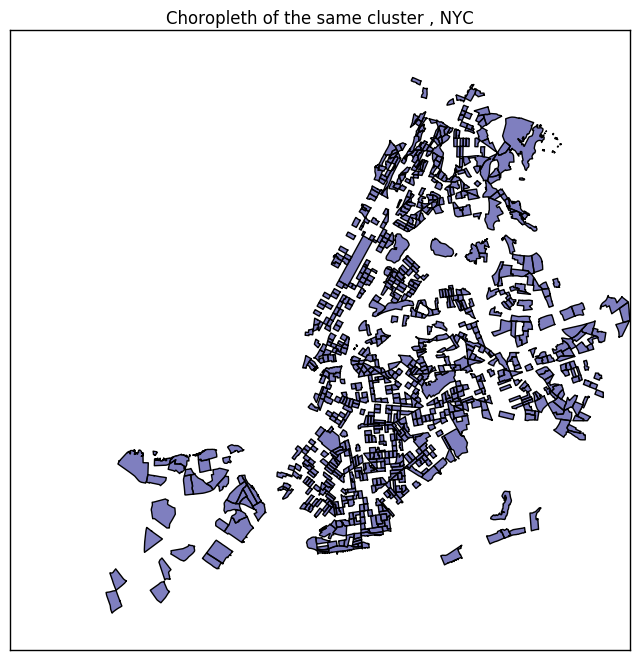

In [364]:
f, ax = plt.subplots(figsize=(8,8))
ax.get_xaxis().set_visible(False)
ax.get_yaxis().set_visible(False)
df_ct_dropna[df_ct_dropna['dif_label'] == 0].plot(column= 'dif_label',ax=ax)
plt.title("Choropleth of the same cluster , NYC")

## Figure 13 : Neighborhoods that keeping the same cluster in 2000 and 2010

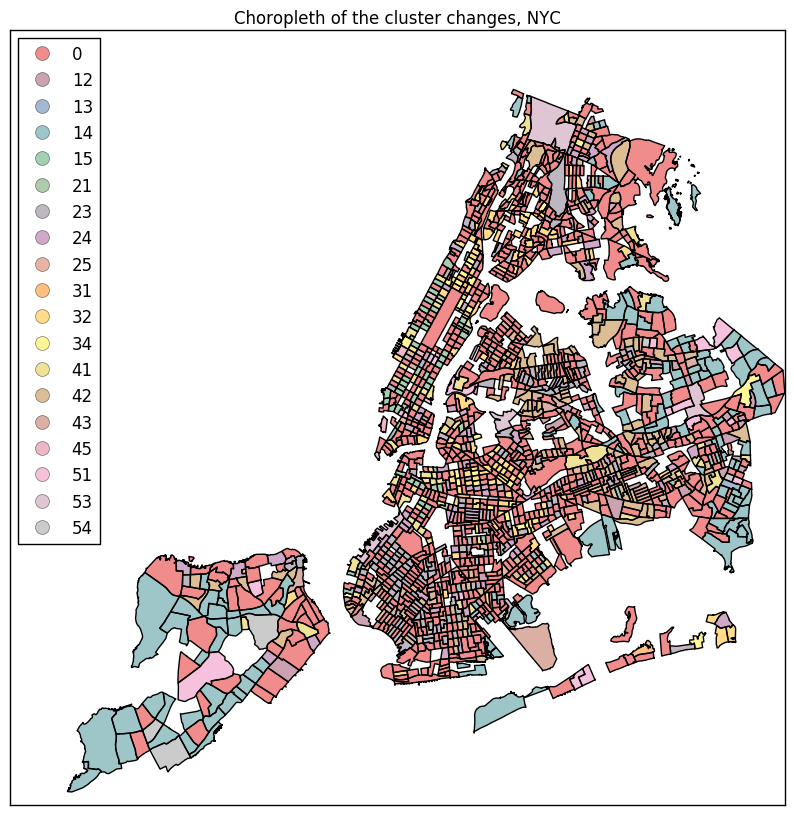

In [538]:
f, ax = plt.subplots(figsize=(10,10))
ax.get_xaxis().set_visible(False)
ax.get_yaxis().set_visible(False)
df_ct_dropna.plot(column= 'dif_label',categorical=True,ax=ax, legend=True)
plt.title("Choropleth of the cluster changes, NYC")

## Figure 14 : Cluster change map in NYC neighborhoods
## The area with the number 0 refers to the neighborhoods that keep the same cluster,while other colors refer to the change in cluster. Each color refer a change combination. 

10) Aggregate the census four features at the zipcode level and merge the zipcode dataframe


In [126]:
#Aggregate the census four features at the zipcode level
nyczipsshp.crs

{u'datum': u'NAD83',
 u'lat_0': 40.16666666666666,
 u'lat_1': 40.66666666666666,
 u'lat_2': 41.03333333333333,
 u'lon_0': -74,
 u'no_defs': True,
 u'proj': u'lcc',
 u'units': u'us-ft',
 u'x_0': 300000,
 u'y_0': 0}

In [128]:
NYCZip = NYCZip.to_crs(epsg=4326)
NYCZip.geometry.centroid.head()

0    POINT (-73.79650291307246 40.67587193168362)
1    POINT (-73.93632725364334 40.67115627716159)
2    POINT (-73.91307734894315 40.66281293521185)
3    POINT (-73.95395957733187 40.66311492141455)
4    POINT (-73.97645089168211 40.64332033535875)
dtype: object

In [160]:
ct.geometry.centroid.head()

0    POINT (-73.96357162272913 40.65283693680331)
1    POINT (-73.93817849385184 40.68389708695573)
2    POINT (-73.85210982299243 40.83235742729679)
3    POINT (-73.80002157849106 40.79030242380239)
4    POINT (-73.95065299870262 40.74321286156224)
dtype: object

In [133]:
#NYCZip[NYCZip.geometry.contains(ct.geometry.centroid[1])].ZIP.values[0]

'11233'

In [168]:
zipfromcen = []

In [169]:
for i in range(len(df_ct_total.geometry.centroid)):
    try:
        zipcode = NYCZip[NYCZip.geometry.contains(df_ct_total.geometry.centroid[i])].ZIP.values[0]
        zipfromcen.append(zipcode)
    except:
        zipfromcen.append(0)
        print (i)

22
24
83
296
813
1755
1860


In [366]:
df_ct_total['ZIP'] = zipfromcen

In [198]:
df_ct_total.head(2)

,geo_id,2000population,2000diversity,2000age,2000income,boro_code_x,boro_ct_2010_x,boro_name_x,cartodb_id_x,cdeligibil_x,...,ct_2010,ctlabel,geometry,ntacode,ntaname,puma,shape_area,shape_leng,allcodes,ZIP
0,1400000US36047054300,0,NaN,0.0,0,3,3054300,Brooklyn,1528,E,...,054300,543,"(POLYGON ((-73.97892899999999 40.705932, -73.9...",BK99,park-cemetery-etc-Brooklyn,4004,11164670.0984,40359.3149728,"(Brooklyn, 054300)",11251
1,1400000US36081121100,0,NaN,0.0,0,4,4121100,Queens,665,I,...,121100,1211,"(POLYGON ((-73.794676 40.747212, -73.79458 40....",QN99,park-cemetery-etc-Queens,4103,11184981.8522,15525.2865839,"(Queens, 121100)",11365


In [368]:
df_aggregate = df_ct_total.groupby('ZIP').agg(np.mean)

In [370]:
df_aggregate['ZIP'] = df_aggregate.index.astype(str)
df_aggregate.head()

,2000population,2000diversity,2000age,2000income,2010population,2010diversity,2010age,2010income,dif_population,dif_diversity,dif_age,dif_income,cartodb_id,ZIP
ZIP,,,,,,,,,,,,,,
0,1541.428571,90.700000,16.557143,27164.142857,1532.857143,64.850000,26.085714,44820.428571,-8.571429,-4.233333,9.528571,17656.285714,1561.142857,0
00083,18.000000,44.400000,38.500000,18750.000000,25.000000,24.000000,43.200000,0.000000,7.000000,-20.400000,4.700000,-18750.000000,1891.000000,00083
10001,2149.333333,63.566667,37.000000,53814.666667,2610.000000,63.550000,34.633333,137284.000000,460.666667,-0.016667,-2.366667,84801.600000,1552.500000,10001
10002,6061.142857,35.821429,37.857143,25544.357143,5758.357143,40.385714,39.821429,56478.785714,-302.785714,4.564286,1.964286,30934.428571,1313.142857,10002
10003,5294.300000,77.980000,33.970000,67424.400000,5528.200000,76.630000,32.670000,161108.800000,233.900000,-1.350000,-1.300000,93684.400000,1234.300000,10003


11) Repeat steps 7,8,9 at the zipcode level (NOT OPTIONAL AT THE ZIPCODE LEVEL) with the added feature (density of businesses).

In [473]:
df_merge.head()

,2000,2010,ZIP,geometry,Area,2000_density,2010_density,log_2000_density,log_2010_density,dif
0,7317,7241.0,10001,"POLYGON ((981958.6472873986 213464.4530421346,...",0.638269,11463.818261,11344.746211,9.346951,9.336510,119.072050
1,2277,2872.0,10002,"POLYGON ((991339.8703228086 207576.7837151289,...",0.942616,2415.618317,3046.840495,7.789711,8.021860,-631.222178
2,3683,4113.0,10003,"POLYGON ((989830.469142139 207048.1263078749, ...",0.557331,6608.286428,7379.821363,8.796080,8.906505,-771.534935
3,1294,1398.0,10004,"POLYGON ((981197.408652395 196571.0816452205, ...",0.143562,9013.498952,9737.922361,9.106479,9.183783,-724.423409
4,1294,1398.0,10004,"POLYGON ((972696.8446168154 193014.5477478057,...",0.043139,29996.248352,32407.075112,10.308828,10.386132,-2410.826761


In [547]:
#merge with the added feature
df_final = pd.merge(df_aggregate,df_merge,how='inner', on=['ZIP'])

In [548]:
df_final = pd.DataFrame.dropna(df_final)
len(df_final)

185

In [550]:
df_final = df_final.rename(columns = {'2000_density': '2000density', '2010_density': '2010density'})
df_final['dif_density'] = df_final['2010density'] - df_final['2000density']
df_final.head()

,2000population,2000diversity,2000age,2000income,2010population,2010diversity,2010age,2010income,dif_population,dif_diversity,...,cartodb_id,ZIP,2000,2010,geometry,Area,2000density,2010density,dif,dif_density
0,2149.333333,63.566667,37.000000,53814.666667,2610.000000,63.550000,34.633333,137284.000000,460.666667,-0.016667,...,1552.500000,10001,7317,7241.0,"POLYGON ((981958.6472873986 213464.4530421346,...",0.638269,11463.818261,11344.746211,-119.072050,-119.072050
1,6061.142857,35.821429,37.857143,25544.357143,5758.357143,40.385714,39.821429,56478.785714,-302.785714,4.564286,...,1313.142857,10002,2277,2872.0,"POLYGON ((991339.8703228086 207576.7837151289,...",0.942616,2415.618317,3046.840495,631.222178,631.222178
2,5294.300000,77.980000,33.970000,67424.400000,5528.200000,76.630000,32.670000,161108.800000,233.900000,-1.350000,...,1234.300000,10003,3683,4113.0,"POLYGON ((989830.469142139 207048.1263078749, ...",0.557331,6608.286428,7379.821363,771.534935,771.534935
3,481.666667,80.100000,31.100000,62235.666667,247.333333,57.750000,25.966667,0.000000,-234.333333,-12.400000,...,1142.333333,10004,1294,1398.0,"POLYGON ((981197.408652395 196571.0816452205, ...",0.143562,9013.498952,9737.922361,724.423409,724.423409
4,481.666667,80.100000,31.100000,62235.666667,247.333333,57.750000,25.966667,0.000000,-234.333333,-12.400000,...,1142.333333,10004,1294,1398.0,"POLYGON ((972696.8446168154 193014.5477478057,...",0.043139,29996.248352,32407.075112,2410.826761,2410.826761


In [559]:
geo_df_final = gpd.GeoDataFrame(df_final)

In [560]:
final_2000 = ['2000population','2000diversity','2000age','2000income','2000density']
final_2010 = ['2010population','2010diversity','2010age','2010income','2010density']
difference = ['dif_population','dif_diversity','dif_age','dif_income','dif_density']
variables = ['population', 'diversity','median age','median income','density']

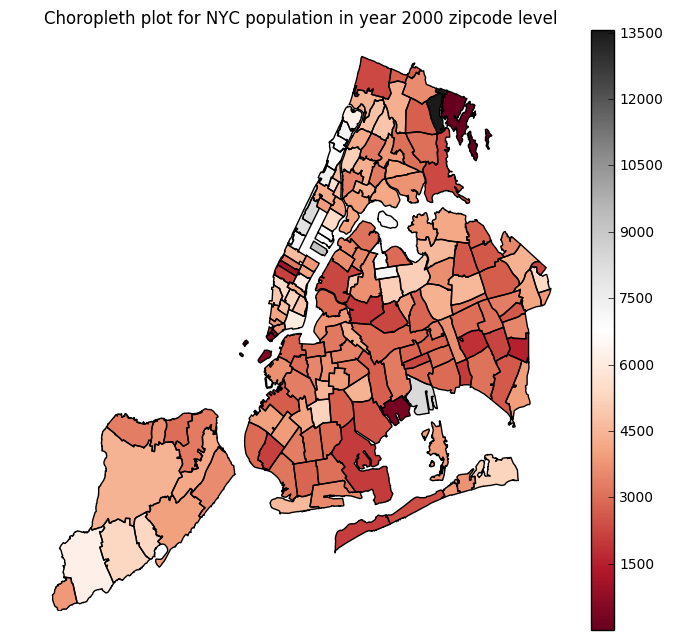

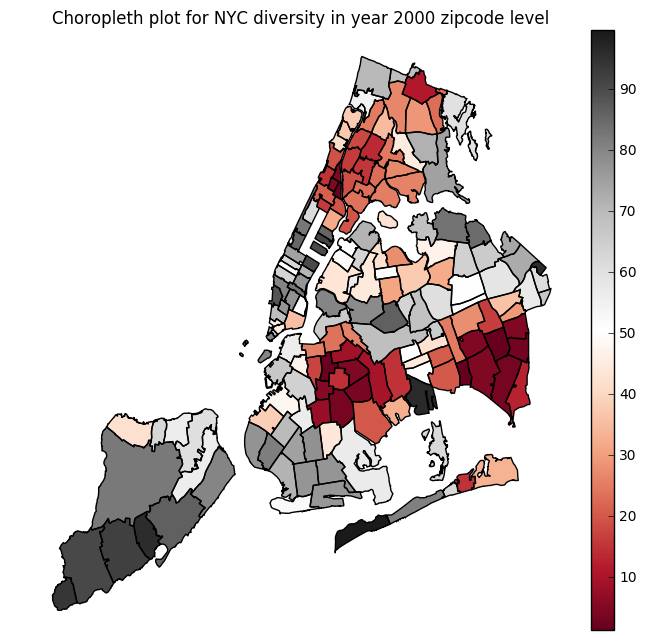

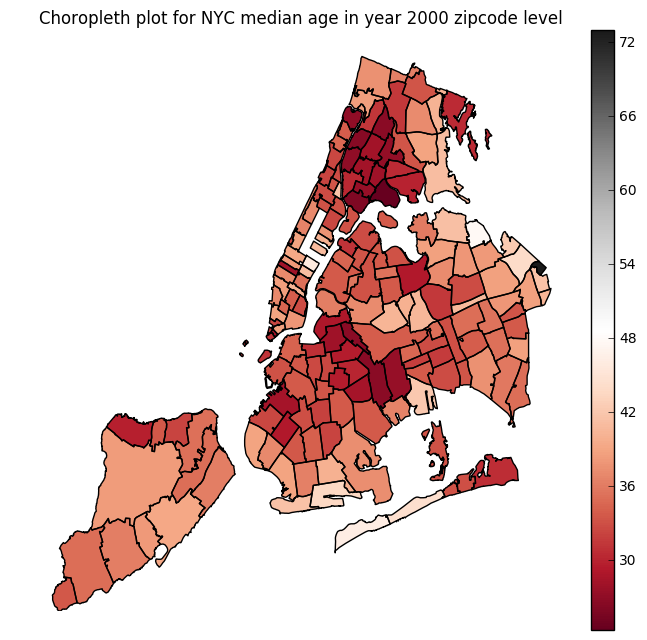

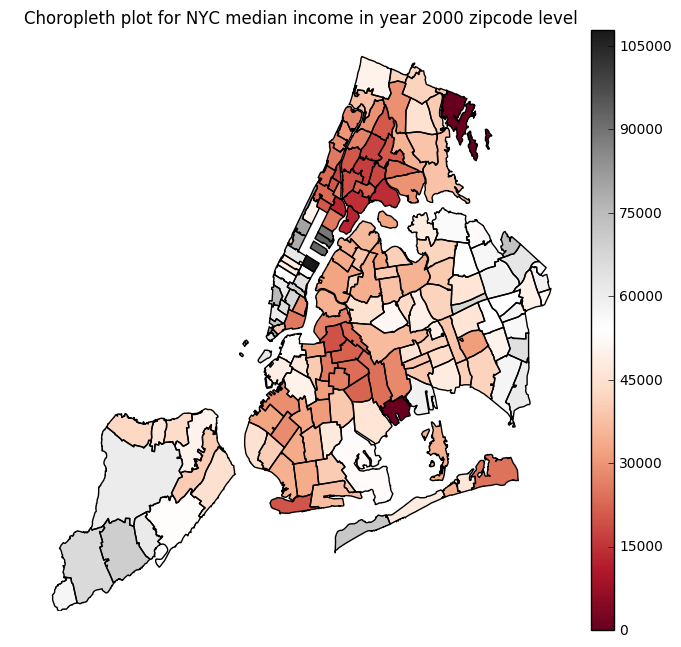

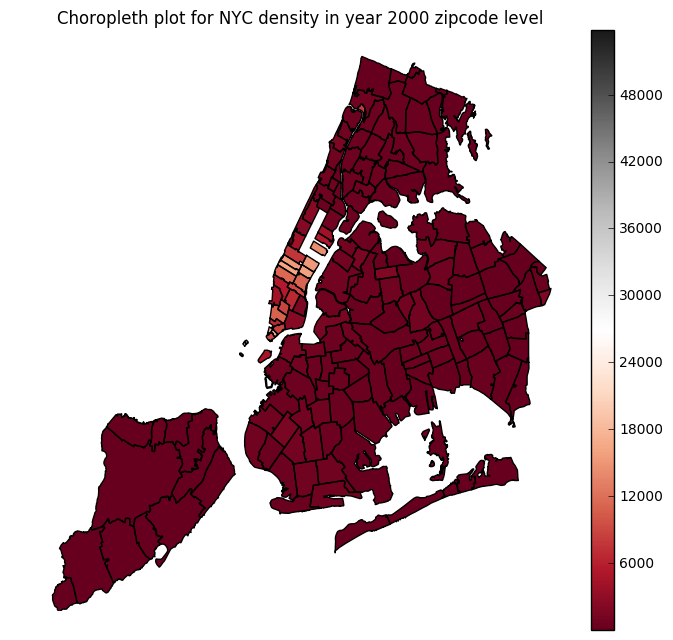

In [562]:
for i in range(len(final_2000)):
    choropleth(geo_df_final,final_2000[i],\
               "Choropleth plot for NYC %s in year 2000 zipcode level"%(variables[i])\
               ,cmap = 'viridis', ax=None)

## Figure 15 : Choropleth plot in year 2000, NYC zip code level
## A neighborhood in upper Bronx has a highest density overall.Midtown, upper east and west show a relative high population density while a relative low diversity. Diversity in Bronx, Brooklyn and some places in Queens are higher while median age are lower. There are more young people living in Brooklyn and Bronx. Considering median income, people live in upper east and upper west, midtown west have the highest income over the whole city.  people in Bronx are relatively low incomed.  As mentioned before, midtown, downtown and upper west have higher business density.

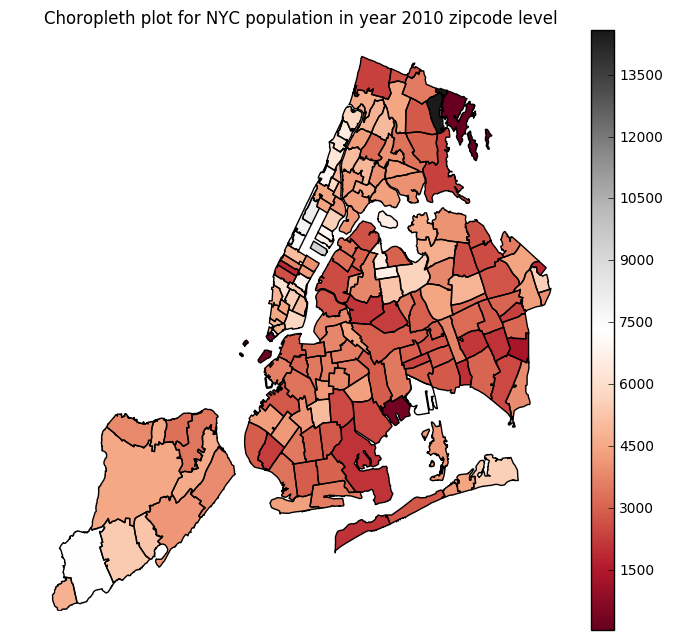

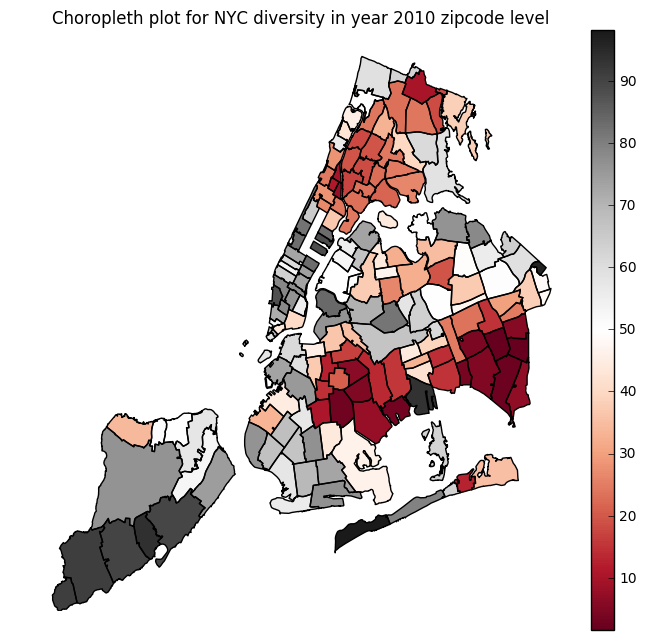

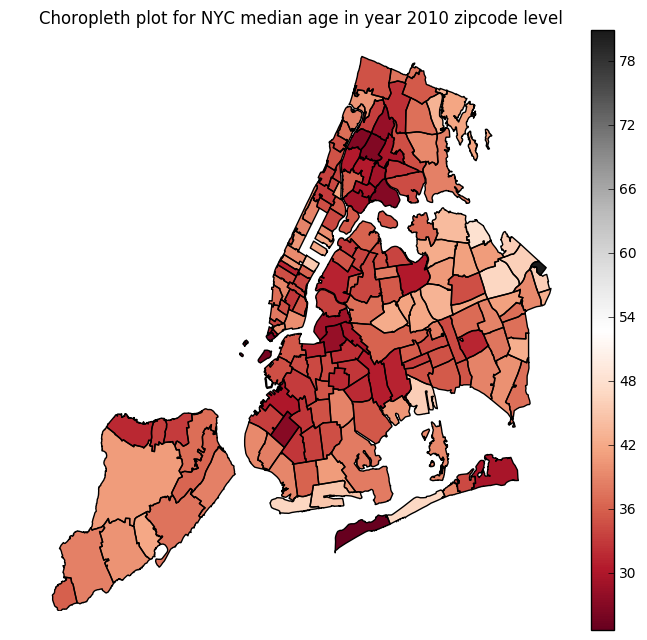

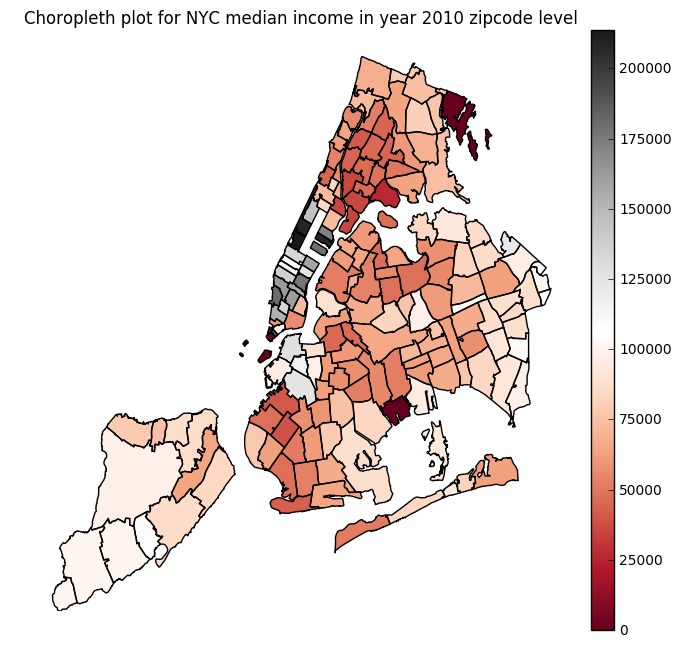

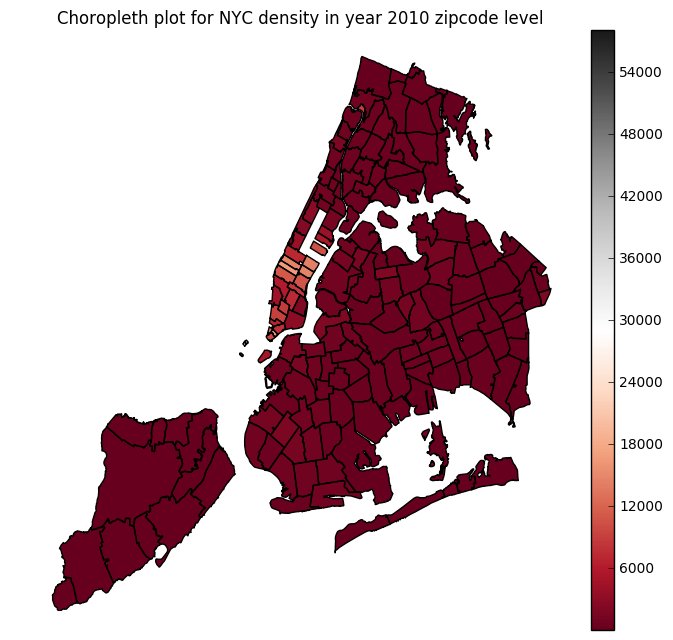

In [563]:
for i in range(len(final_2010)):
    choropleth(geo_df_final,final_2010[i],\
               "Choropleth plot for NYC %s in year 2010 zipcode level"%(variables[i])\
               ,cmap = 'viridis', ax=None)

## Figure 16 : Choropleth plot in year 2010, NYC zip code level
## Population distribution does not change a lot:
## A neighborhood in upper Bronx has a highest population density overall.Midtown, upper east and west show a relative high population density while a relative low diversity. Diversity in Bronx, Brooklyn and some places in Queens are quite high while upper west, midtown and downtown Manhattan have relative low diversity. There are more young people living in Brooklyn and Bronx. Considering median income, people live in upper east and upper west, midtown west have the highest income over the whole city.  people in Bronx are relatively low incomed.  As mentioned before, midtown, downtown and upper west have higher business density.

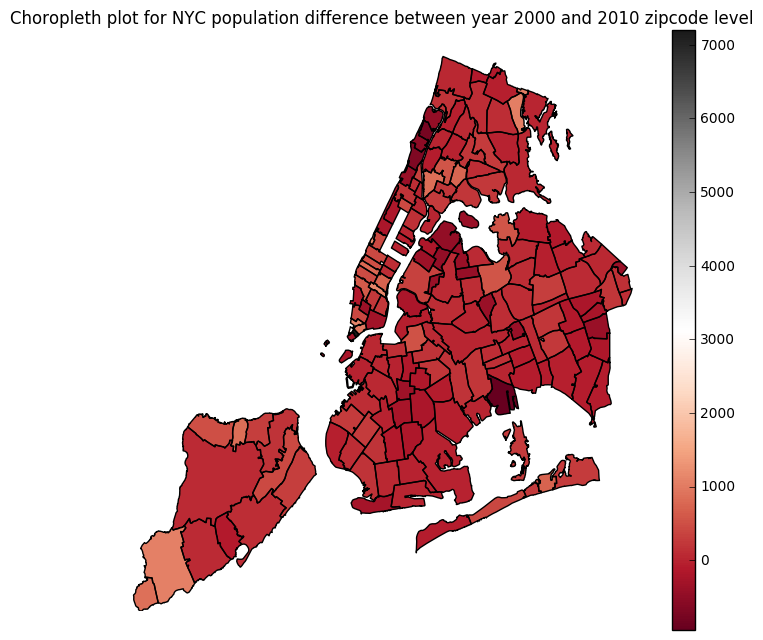

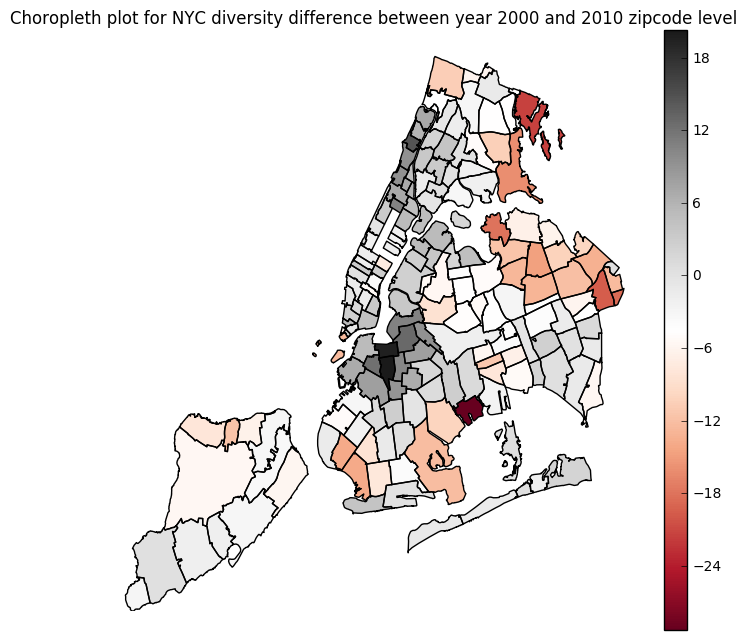

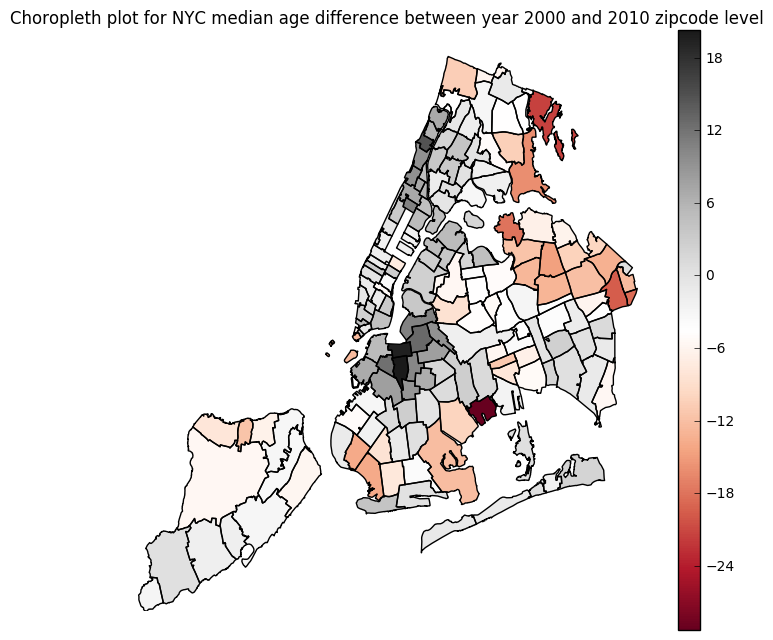

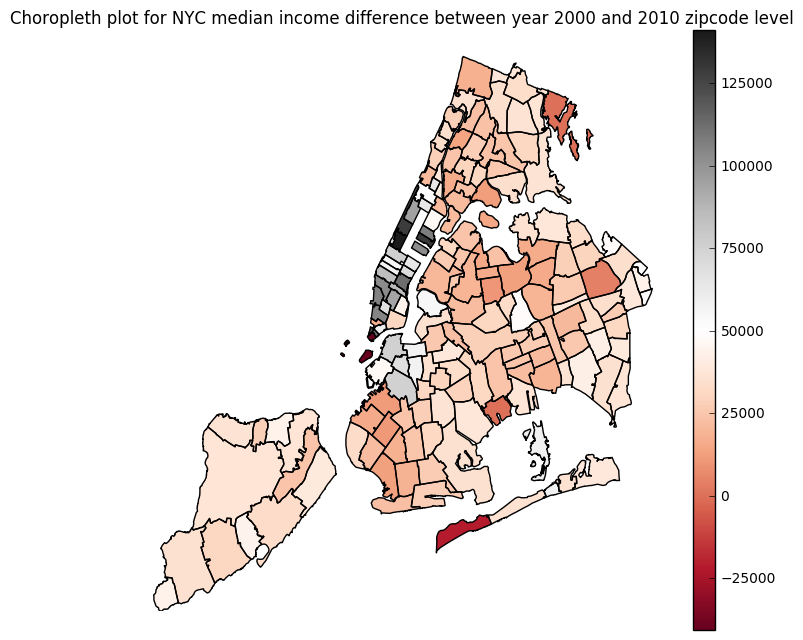

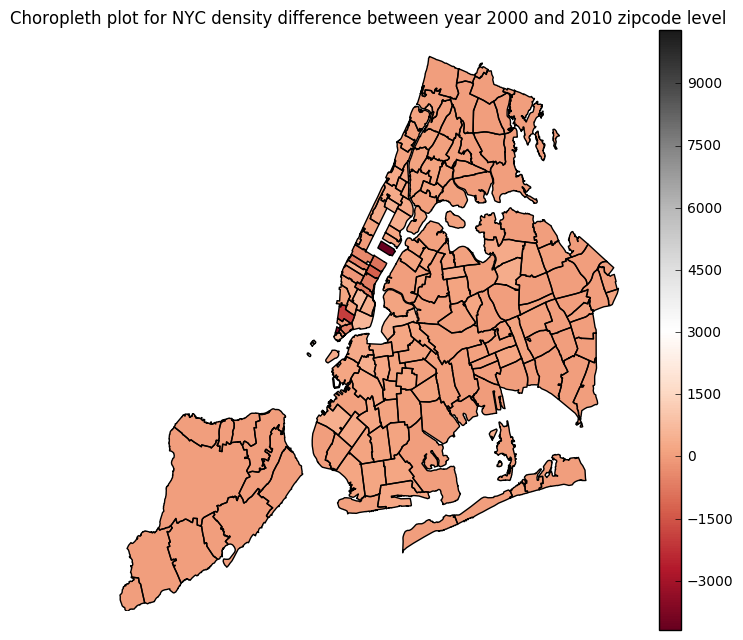

In [593]:
for i in range(len(difference)):
    choropleth(geo_df_final,difference[i],\
               "Choropleth plot for NYC %s difference between year 2000 and 2010 zipcode level"%(variables[i])\
               ,cmap = 'viridis', ax=None)

## Figure 17 : Choropleth plot showing difference between year 2000 and 2010, NYC
## Compared to 2000: Population distribution does not change a lot.Some places in Bronx, Brooklyn turn to have higher diversity but Manhattan and downtown Brooklyn lose diversity. Some places in Queens and south Brooklyn have more young people while median age in Manhattan, downtown Brooklyn and riverside Bronx increases. Income shows an increasing trend in the whole city but upper east, upper west, midtown, downtown Manhattan and downtown Brooklyn show a higher income increase rate. The density of business decreases over the whole city but it decreases more in midtown and downtown Manhattan. 


In [565]:
#Clustering
kmzip00 = KMeans(n_clusters = nc, random_state= 444)
kmzip00.fit(df_final[['2000population','2000diversity','2000income','2000age','2000density']])
labelszip00 = kmzip00.labels_
centerszip00 = kmzip00.cluster_centers_

In [566]:
#Clustering
kmzip10 = KMeans(n_clusters = nc, init = centerszip00)
kmzip10.fit(df_final[['2010population','2010diversity','2010income','2010age','2010density']])
labelszip10 = kmzip10.labels_
centerszip10 = kmzip10.cluster_centers_

In [567]:
df_final['labelszip00'] = labelszip00
df_final['labelszip10'] = labelszip10

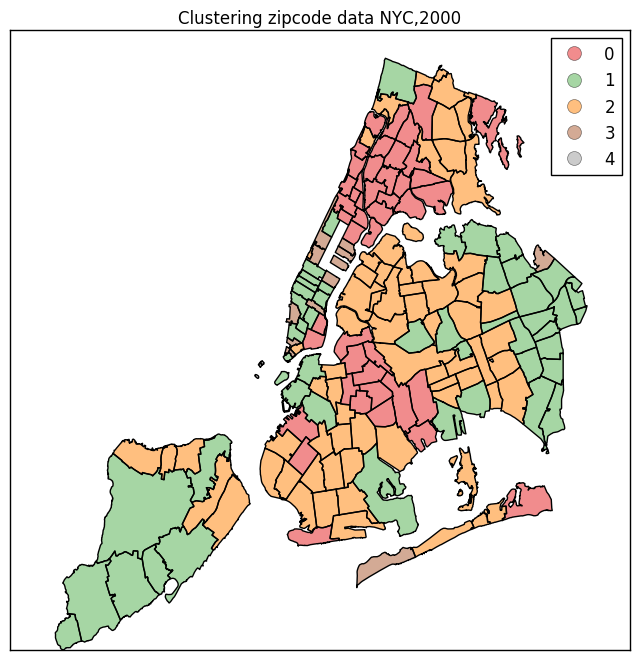

In [574]:
f, ax = plt.subplots(figsize=(8,8))
ax.get_xaxis().set_visible(False)
ax.get_yaxis().set_visible(False)
geo_df_final.plot(column= 'labelszip00',categorical=True,legend = True,ax=ax)
plt.title("Clustering zipcode data NYC,2000")

## Figure 18 : Clustering NYC 2000 census data by 5 clusters using k means, zip code level

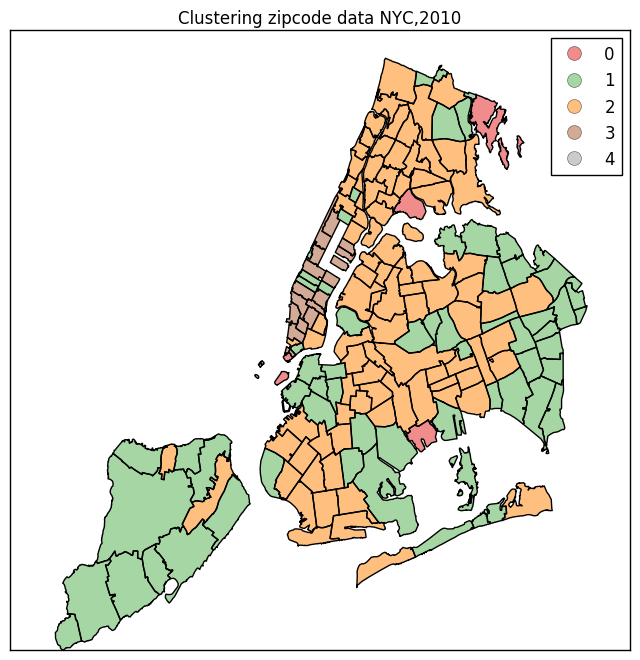

In [575]:
f, ax = plt.subplots(figsize=(8,8))
ax.get_xaxis().set_visible(False)
ax.get_yaxis().set_visible(False)
geo_df_final.plot(column= 'labelszip10',categorical=True,legend = True,ax=ax)
plt.title("Clustering zipcode data NYC,2010")

## Figure 19 : Clustering NYC 2010 census data by 5 clusters using k means, zip code level

/opt/rh/anaconda/root/envs/PUI2016_Python2/lib/python2.7/site-packages/ipykernel/__main__.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy


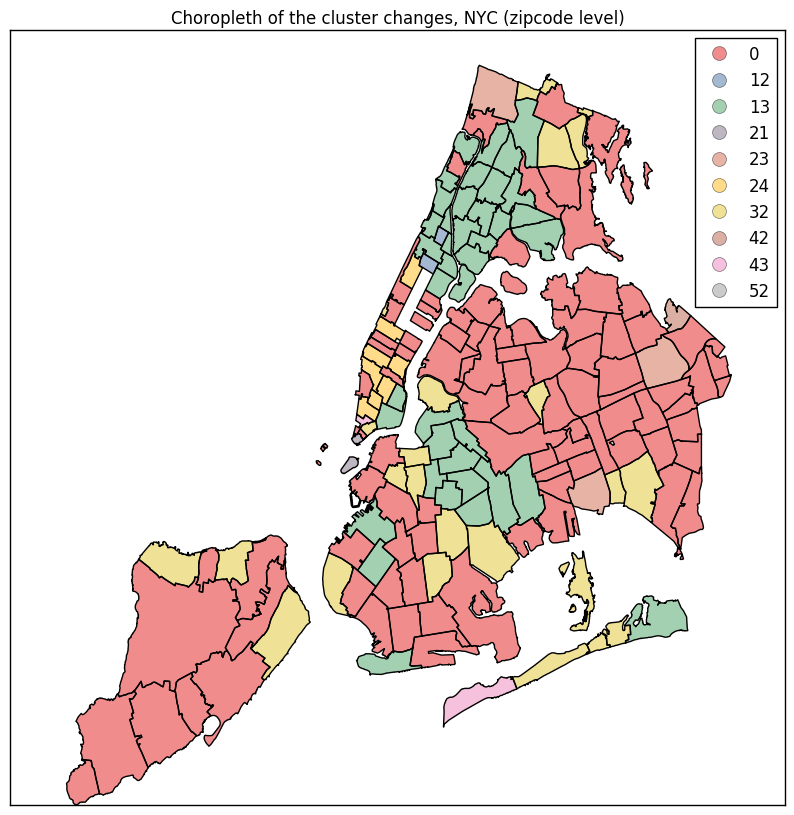

In [570]:
geo_df_final['dif_label'] = 10 * (geo_df_final['labelszip00'] +1) + (geo_df_final['labelszip10'] + 1)
unique(geo_df_final['dif_label'])
cluster_same = [11,22,33,44,55]
geo_df_final.dif_label[geo_df_final['dif_label'].isin(cluster_same)] = 0
f, ax = plt.subplots(figsize=(10,10))
ax.get_xaxis().set_visible(False)
ax.get_yaxis().set_visible(False)
geo_df_final.plot(column= 'dif_label',categorical=True,ax=ax,legend = True)
plt.title("Choropleth of the cluster changes, NYC (zipcode level)")

## Figure 20 : Clusters change in NYC neighborhood, zip code level
## Pink areas refer to ones that have the same cluster in year 2000 and 2010 while other refers to the change in cluster.  There is a main change from cluster 1 to 3 (green area) in Brooklyn and Queens.

12) Define a function that given a dataframe containing the relevant information and two cluster labels finds if the census tract changed cluster assignments from the first to the second label, and if so finds the individual features that are significantly different as measured by Pearson's correlation, plot those zip codes, and plot a histogram of the features that have significantly changed. Run your function for all label pairs (2 points, one for the identification of locations that changed cluster and one for the identifiation of the features that changed significantly).

In [610]:
#define a function
def plotsigfeature(df):
    """
    Arguments:
    df: data frame
    Return:
        Choropleth that have individual features significantly different as measured by Pearson's correlation
        Histogram of the features that have significantly changed
    """
    count_array = np.array([0,0,0,0,0])
    df['dif_label'] = 10 * (df['labelszip00'] + 1 ) +  df['labelszip00'] + 1
    df['dif_label'][df['labelszip00'] == df['labelszip10']] = 0
    df['dif_zip'] = 0
    combinations = unique(df['dif_label'])
    combinations = combinations[np.nonzero(combinations)]
    corr_array = []
    difference = ['dif_population','dif_diversity','dif_diversity','dif_income']
    variables = ['age','income','diversity','population','density']
    for i in range(len(combinations)):                             
        corr_age = scipy.stats.pearsonr(df[df['dif_label'] == combinations[i]]['2000age'].sort_values(), \
                                            df[df['dif_label'] == combinations[i]]['2010age'].sort_values())[0]
        corr_income = scipy.stats.pearsonr(df[df['dif_label'] == combinations[i]]['2000income'].sort_values(), \
                                            df[df['dif_label'] == combinations[i]]['2010income'].sort_values())[0]
        corr_diversity = scipy.stats.pearsonr(df[df['dif_label'] == combinations[i]]['2000diversity'].sort_values(), \
                                            df[df['dif_label'] == combinations[i]]['2010diversity'].sort_values())[0]
        corr_population = scipy.stats.pearsonr(df[df['dif_label'] == combinations[i]]['2000population'].sort_values(), \
                                            df[df['dif_label'] == combinations[i]]['2010population'].sort_values())[0]
        corr_density = scipy.stats.pearsonr(df[df['dif_label'] == combinations[i]]['2000density'].sort_values(), \
                                            df[df['dif_label'] == combinations[i]]['2010density'].sort_values())[0]
        corr_array.append([corr_age,corr_income,corr_diversity,corr_population,corr_density]) 
        for j in range(len(count_array)):
            if corr_array[i][j] < 0.9:
                print("correlation between year 2000 and year 2010 for NYC %s is:" %(variables[j]))
                print(corr_array[i][j])
                pl.figure(figsize = (10, 8))
                h1 = pl.hist(df['2000'+variables[j]], normed=True)
                h2 = pl.hist(df['2010'+variables[j]], normed=True, alpha = 0.5)
                title = pl.title("histogram of %s in NYC" %(variables[j]))
                leg = pl.legend()
                pl.xlabel('%s'%(variables[j]))
                pl.ylabel("Percentage")
                df['dif_zip'][df['dif_label'] == combinations[i]] = 1
                count_array[j] = count_array[j] + 1 
    #construct a data frame for plotting the histogram 
    f, ax = plt.subplots(figsize=(10,10))
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)
    df.plot(column= 'dif_zip',categorical=True,ax=ax,legend = True)
    plt.title("Choropleth of the cluster changes, NYC (zipcode level)")

13) Comment on the strength and weaknesses of this analysis, and on your findings (this is not the last step, but comments should be given throughout the notebook, and summarized here).

## Comment

This goal of this analysis is to identify NYC neighborhoods that are homogeneous 
by clustering their socioeconomic characteristics in 2000 and in 2010,and find the neighborhoods 
that change cluster,indicating that they evolve differently with respect to their cluster peers.
The strength is that various variables including demographic and business data are considered, so
that the data set could simulate real evolution well. 
Moreover, using choropleth and heatmap to visualize the evolution is truly smart since it gives direct 
impression. 

Still, there are some weakness in this analysis. First, only two years data are used, so it might not 
be enough to show the evolution. Additionally, the choice of year might be arbitrary. 
Second, using the precentage of white people as the measurement of population diversity might not be 
the best choice. 
Third, the quality of census data is not good since it has a lot of missing values, which will 
shrink our dataset and influent the result of the analysis.
Fourth, using K means to do the cluster is not robust since the clustering result might change each time.
Moreover, it's hard to choose the optimal number of clusters.
At last, using Pearson's correlation coefficient to find the feature that significantly different from
others is not persuasive. Since all of the features are highly correlated, it does not make sense to choose 
a threshold as 0.9. 



## Insights

/opt/rh/anaconda/root/envs/PUI2016_Python2/lib/python2.7/site-packages/ipykernel/__main__.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
/opt/rh/anaconda/root/envs/PUI2016_Python2/lib/python2.7/site-packages/ipykernel/__main__.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy


correlation between year 2000 and year 2010 for NYC income is:
0.873190521572


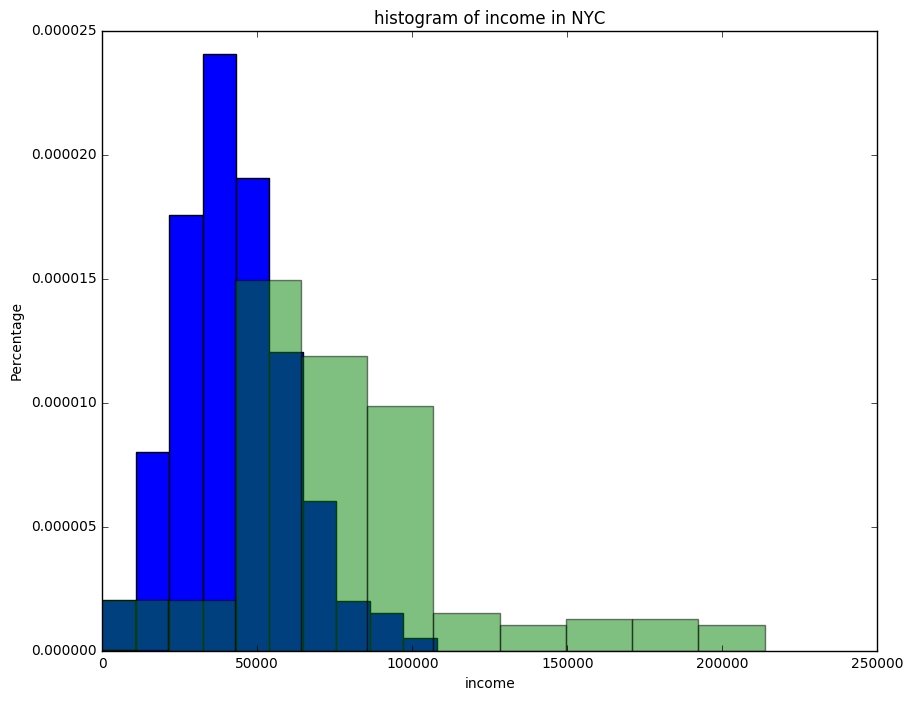

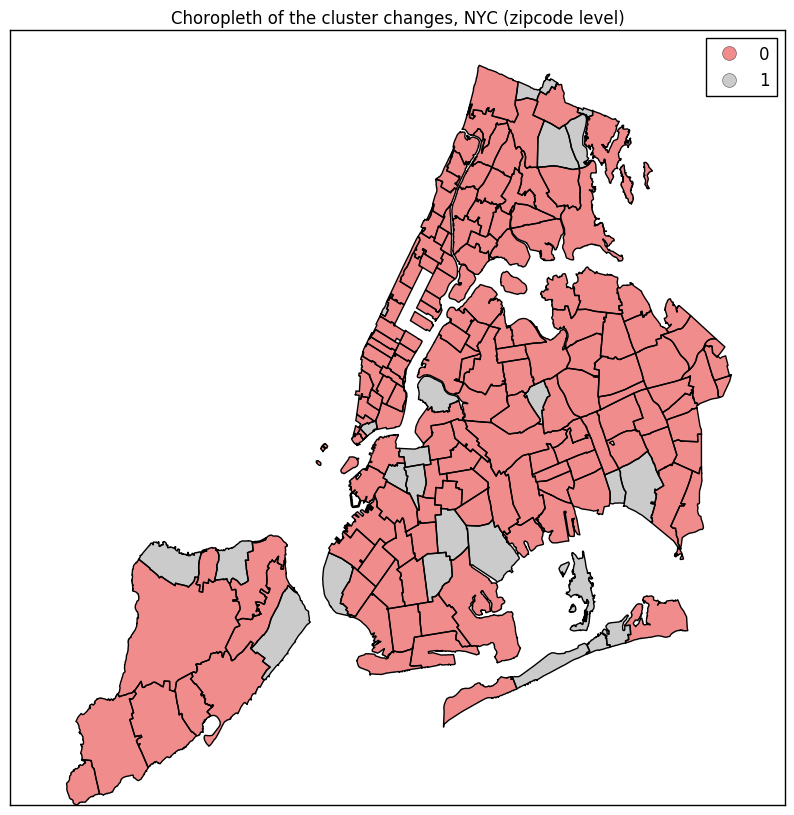

In [615]:
plotsigfeature(geo_df_final)

## Figure 21 : Choropleth that have individual features significantly different as measured by Pearson's correlation and Histogram of the features that have significantly changed

Through this analysis, we could find that most of the NYC neighborhoods that are homogeneous 
when clustering their socioeconomic characteristics in 2000 and in 2010.
This is not surprising since that all five features: total population,population diversity,
median income, median age and business density are highly correlated in 2000 and 2010 data.
However, through above choropleths we have some intersting findings: 
1. The pace of business increasing slows down, especially in midtown and downtoan Manhattan.

2. There are more young people living in Brooklyn and Bronx, but young generations have the trend moving
to Manhattan over these years.

3. The total population distribution does not change a lot, but population diversity increases in 
most of the neighborhoods, but decreases in some of them.

4. People live in upper east and upper west, midtown west have the highest income over the whole city.
people in Bronx are relatively low incomed.  The distribution does not change a lot though median income
increases a lot over 10 years for the whole city.

From the clustering result, most of the NYC neighborhoods are homogeneous since they stick to the same cluster, no matter in the census track level or in the zip code level. However, the census track level clustering does change more than in zip code level.
Considering boroughs, Manhattan is homogeneous since there is no significant change in cluster. All other boroughs have changes, but not too much. It seems like the changes are most likely to result from the median income. 